# Installing Libraries

In [1]:
!pip install torchmetrics scikit-learn medpy
!pip install monai
!pip install segmentation-models-pytorch
!pip install pretrained-backbones-unet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.3/156.3 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00

In [2]:
!pip uninstall timm
!pip install timm

Found existing installation: timm 0.6.12
Uninstalling timm-0.6.12:
  Would remove:
    /usr/local/lib/python3.11/dist-packages/timm-0.6.12.dist-info/*
    /usr/local/lib/python3.11/dist-packages/timm/*
Proceed (Y/n)? y
  Successfully uninstalled timm-0.6.12
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 44.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pretrained-backbones-unet 0.0.1 requires timm==0.6.12, but you have timm 1.0.14 which is incompatible.


In [3]:
!pip show pretrained-backbones-unet

Name: pretrained-backbones-unet
Version: 0.0.1
Summary: A small example package
Home-page: https://github.com/mberkay0/pretrained-backbones-unet
Author: Berkay Mayali
Author-email: Example Author <author@example.com>
License: MIT
Location: /usr/local/lib/python3.11/dist-packages
Requires: timm, torch
Required-by: 


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Our imports

In [5]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import torchvision.transforms.functional as F
from tqdm import tqdm  # for progress bars
from backbones_unet.model.unet import Unet
# import segmentation_models_pytorch as smp
from torchvision.transforms import InterpolationMode
import random
import matplotlib.pyplot as plt
#cudnn module from PyTorch, which provides access to NVIDIA's CUDA Deep Neural Network library (cuDNN). cuDNN is a library of highly optimized primitives for deep learning.
import torch.backends.cudnn as cudnn
import backbones_unet
from torch.amp import autocast, GradScaler  # Import from torch.amp
from tabulate import tabulate

#Setting Up Reproducibility and CUDA Environment

In [6]:
# Set seed for reproducibility
SEED = 42
#This line sets the seed for Python's built-in random module.
random.seed(SEED)
#This line sets the seed for NumPy's random number generator.
np.random.seed(SEED)
#This line sets the seed for PyTorch's random number generator for the CPU.
torch.manual_seed(SEED)
if torch.cuda.is_available():
#sets the seed for PyTorch's random number generator for all available GPUs.
    torch.cuda.manual_seed_all(SEED)

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

 # Defines essential parameters for your model training , specifies the locations of your data, determines the size of your datasets, and sets up a location to save your trained model.

In [7]:
########################################
# Network and Training Parameters      #
########################################
IMG_SIZE = 256
NBEPOCHS = 200
BATCH_SIZE = 64
NBPATIENCE_EPOCHS = 200
NUM_CLASSES = 4 # Assuming 3 classes as confirmed

train_images_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/train/images"
train_masks_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/train/labels"
valid_images_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/valid/images/"
valid_masks_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/valid/labels"
test_images_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/test/images"
test_masks_path = "/content/drive/MyDrive/✨ GP ✨/CAMUS_PNG/dataset/test/labels"

# Function to count the number of files in a directory
def count_files(directory):
    return len([file for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))])

# Print dataset sizes
print("Dataset Sizes:")
print(f"Train Images: {count_files(train_images_path)}")
print(f"Train Masks: {count_files(train_masks_path)}")
print(f"Validation Images: {count_files(valid_images_path)}")
print(f"Validation Masks: {count_files(valid_masks_path)}")
print(f"Test Images: {count_files(test_images_path)}")
print(f"Test Masks: {count_files(test_masks_path)}")

model_path = 'trained_model/'
os.makedirs(model_path, exist_ok=True)


Dataset Sizes:
Train Images: 800
Train Masks: 800
Validation Images: 100
Validation Masks: 100
Test Images: 100
Test Masks: 100


#Custom Dual Transform Class for Image and Mask Augmentation

In [8]:
#cuDNN will search for the optimal algorithms for your model and hardware during the first few iterations.
cudnn.benchmark = True

class DualTransform:
    def __init__(self, img_size=128, angle=5, translate=(0.05, 0.05), scale=(0.8, 1.2), fill=0, augment=True):
        self.img_size = img_size
        self.angle = angle
        self.translate = translate
        self.scale = scale
        self.fill = fill
        self.augment = augment

    #This method gets called when you apply the DualTransform object to an image-mask pair.
    def __call__(self, image, mask):
      #Resizes both the image and mask to img_size using bilinear and nearest-neighbor interpolation, respectively.
        #Images: Bilinear interpolation for smooth, visually appealing results.
        #Masks: Nearest-neighbor interpolation to preserve sharp class boundaries.
        image = F.resize(image, (self.img_size, self.img_size), interpolation=InterpolationMode.BILINEAR)
        mask = F.resize(mask, (self.img_size, self.img_size), interpolation=InterpolationMode.NEAREST)

        if self.augment:
            angle = random.uniform(-self.angle, self.angle)
            max_dx = self.translate[0] * self.img_size
            max_dy = self.translate[1] * self.img_size
            translations = (random.uniform(-max_dx, max_dx), random.uniform(-max_dy, max_dy))
            scale_factor = random.uniform(self.scale[0], self.scale[1])
            shear = 0.0
            image = F.affine(image, angle=angle, translate=translations, scale=scale_factor, shear=shear, fill=self.fill)
            mask = F.affine(mask, angle=angle, translate=translations, scale=scale_factor, shear=shear, fill=0)
        #Converts the image to a PyTorch tensor using F.to_tensor.
        image = F.to_tensor(image)
        image = F.normalize(image, mean=[0.5], std=[0.5])
        #Converts the mask to a NumPy array and then to a PyTorch tensor.
        mask = np.array(mask, dtype=np.int64)
        mask = torch.from_numpy(mask)
        mask = self.remap_mask(mask)
        return image, mask

    @staticmethod
    #This method remaps the mask values to specific class labels
    def remap_mask(mask):
        remapped = torch.zeros_like(mask)
        remapped[mask == 0] = 0 #bg
        remapped[mask == 85] = 1 #lv
        remapped[mask == 170] = 2 #myo
        remapped[mask == 255] = 3 #la
        return remapped

# Custom Dataset Class for CAMUS Data
 the `CAMUSDataset` class does the following:
1. ***Initialization***:
It takes the directories for images and masks and an optional transform.
It loads the filenames of images and masks, and ensures there's an equal number of both.
2. `__len__:` Returns the total number of samples (images) in the dataset.
3. `__getitem__:` This is the core method that gets called when you access a specific item in the dataset using an index (idx). It:

* Loads the image and mask using the index.
* Applies the provided transform (if any) to both image and mask.
* Return image, mask, and image filename


In [9]:
########################################
# Dataset                              #
########################################

class CAMUSDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(image_dir))
        self.masks = sorted(os.listdir(mask_dir))
        assert len(self.images) == len(self.masks), "Number of images and masks must be the same."

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path)

        if self.transform:
            image, mask = self.transform(image, mask)

        # Return image, mask, and image filename
        return image, mask, self.images[idx]


* ` num_workers=2:` Uses 2 worker processes to load data in parallel, which can speed up data loading.
* ` pin_memory=True:` Copies tensors into CUDA pinned memory before returning them, which can improve performance when transferring data to the GPU.

In [10]:
########################################
# Dataloaders                          #
########################################
train_transform = DualTransform(img_size=IMG_SIZE, angle=5, translate=(0.05,0.05), scale=(0.8,1.2), augment=True) #False as the paper
valid_transform = DualTransform(img_size=IMG_SIZE, angle=0, translate=(0,0), scale=(1,1), augment=False)
test_transform = DualTransform(img_size=IMG_SIZE, angle=0, translate=(0,0), scale=(1,1), augment=False)

train_dataset = CAMUSDataset(train_images_path, train_masks_path, transform=train_transform)
valid_dataset = CAMUSDataset(valid_images_path, valid_masks_path, transform=valid_transform)
test_dataset = CAMUSDataset(test_images_path, test_masks_path, transform=test_transform)

#DataLoader takes a dataset object and provides an iterable over the data, allowing you to efficiently load batches of data during training and evaluation.
# Reduce number of workers as suggested
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

##  Display the augmented images


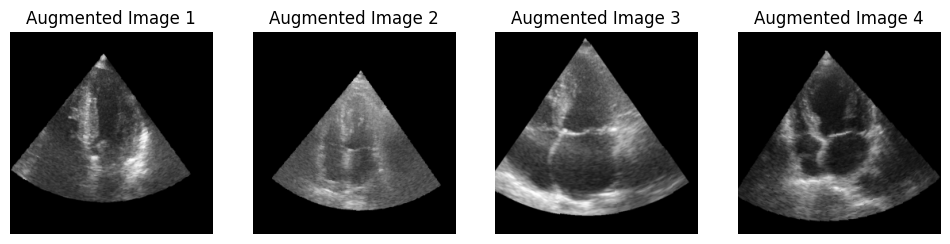

In [11]:
# Create a sample dataset and loader
sample_dataset = CAMUSDataset(train_images_path, train_masks_path, transform=train_transform)
sample_loader = DataLoader(sample_dataset, batch_size=4, shuffle=True)  # Adjust batch_size as needed

# Get a batch of augmented images and masks
images, masks, filenames = next(iter(sample_loader))

# Display the augmented images
fig, axs = plt.subplots(1, 4, figsize=(12, 3))  # Adjust figure size as needed

for i in range(4):  # Assuming batch_size of 4
    # Denormalize the image
    image = images[i].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5
    axs[i].imshow(image)
    axs[i].set_title(f"Augmented Image {i + 1}")
    axs[i].axis("off")

plt.show()

# Model Initialization  

In [12]:

print(backbones_unet.__available_models__)

['convnext_atto', 'convnext_atto_ols', 'convnext_base', 'convnext_base_384_in22ft1k', 'convnext_base_in22ft1k', 'convnext_base_in22k', 'convnext_femto', 'convnext_femto_ols', 'convnext_large', 'convnext_large_384_in22ft1k', 'convnext_large_in22ft1k', 'convnext_large_in22k', 'convnext_nano', 'convnext_nano_ols', 'convnext_pico', 'convnext_pico_ols', 'convnext_small', 'convnext_small_384_in22ft1k', 'convnext_small_in22ft1k', 'convnext_small_in22k', 'convnext_tiny', 'convnext_tiny_384_in22ft1k', 'convnext_tiny_hnf', 'convnext_tiny_in22ft1k', 'convnext_tiny_in22k', 'convnext_xlarge_384_in22ft1k', 'convnext_xlarge_in22ft1k', 'convnext_xlarge_in22k', 'cs3darknet_focus_l', 'cs3darknet_focus_m', 'cs3darknet_l', 'cs3darknet_m', 'cs3darknet_x', 'cs3edgenet_x', 'cs3se_edgenet_x', 'cs3sedarknet_l', 'cs3sedarknet_x', 'cspdarknet53', 'cspresnet50', 'cspresnext50', 'darknet53', 'darknetaa53', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'densenetblur121d', 'dm_nfnet_f0', 'dm_nfnet_f1',

In [13]:
########################################
# Model Initialization                 #
########################################
# model = smp.Unet(
#     encoder_name="resnet34",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
#     in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
#     classes=NUM_CLASSES,                      # model output channels (number of classes in your dataset)
# )

model = Unet(
    backbone='convnext_base',
    in_channels=3,
    num_classes=NUM_CLASSES
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/354M [00:00<?, ?B/s]

#Multi-Class Dice Loss and IoU Calculation

In [14]:
# Custom MultiClassDiceLoss
class MultiClassDiceLoss(nn.Module):
    def __init__(self, from_logits=True, eps=1e-6):
        """
        Initialize the MultiClassDiceLoss.

        Args:
            from_logits (bool): If True, applies softmax to predictions first
            Logits are the raw output values from the final layer of a neural network before any activation function (like softmax) is applied. They're essentially the unnormalized predictions.
            eps (float): Small constant to avoid division by zero
        """
        super().__init__()  # Initialize parent class (nn.Module)
        self.from_logits = from_logits  # Whether input is raw logits
        self.eps = eps  # Small epsilon to prevent division by zero

    def forward(self, y_pred, y_true):
        """
        Compute the multi-class Dice loss.

        Args:
            y_pred: Model predictions (B, C, H, W)
            Variables:
              B: Batch size - The number of samples in the batch.
              C: Number of channels - In semantic segmentation, this usually corresponds to the number of classes.
              H: Height of the feature maps/images.
              W: Width of the feature maps/images.
            y_true: Ground truth labels (B, H, W) with class indices
        """
        # If predictions are logits, convert to probabilities
        if self.from_logits:
            y_pred = torch.softmax(y_pred, dim=1)  # Apply softmax along channel dimension

        B, C, H, W = y_pred.shape  # Get dimensions of prediction tensor
        dice_loss = 0.0  # Initialize total loss

        # Iterate over each class
        for c in range(C):
            # Convert ground truth to one-hot for current class
            y_true_c = (y_true == c).float()  # Binary mask for class c

            # Get predictions for current class
            y_pred_c = y_pred[:, c, :, :]  # Probability map for class c

            # Calculate intersection (TP)
            intersection = (y_pred_c * y_true_c).sum(dim=(1,2))

            # Calculate union (total area)
            union = y_pred_c.sum(dim=(1,2)) + y_true_c.sum(dim=(1,2))

            # Calculate Dice coefficient for current class
            dice_c = (2.0 * intersection + self.eps) / (union + self.eps)

            # Add (1 - dice) to total loss
            dice_loss += (1 - dice_c.mean())

        # Return average loss across all classes
        return dice_loss / C

# Example usage and parameter descriptions:

# For MultiClassDiceLoss:
criterion = MultiClassDiceLoss(
    from_logits=True,  # Set True if model outputs raw logits
    eps=1e-6  # Small constant for numerical stability
)

In [15]:
# Manual IoU Implementation
def compute_iou_manual(pred, target, num_classes=NUM_CLASSES):
    """
    Manually compute IoU (Intersection over Union) for semantic segmentation.

    Args:
        pred (torch.Tensor): Predicted segmentation mask
        target (torch.Tensor): Ground truth segmentation mask
        num_classes (int): Number of classes in the segmentation task

    Returns:
        float: Mean IoU across all classes
    """
    ious = []  # Store IoU for each class
    for c in range(num_classes):
        # Create binary masks for current class
        pred_c = (pred == c)  # Prediction mask for class c
        target_c = (target == c)  # Ground truth mask for class c

        # Calculate intersection and union
        intersection = (pred_c & target_c).sum().item()  # Logical AND for intersection
        union = (pred_c | target_c).sum().item()  # Logical OR for union

        # Calculate IoU if union is non-zero
        if union > 0:
            ious.append(intersection / (union + 1e-6))  # Add small epsilon to prevent division by zero

    # Handle edge case where no valid classes are found
    if len(ious) == 0:
        return 1.0

    # Return mean IoU across all valid classes
    return sum(ious) / len(ious)






#  Training and Validation Workflow for Semantic Segmentation

In [16]:

########################################
# Training & Validation Functions      #
########################################


def train(model, loader, optimizer, criterion, device):
    model.train()
    epoch_loss = 0.0
    epoch_iou = 0.0
    scaler = GradScaler()

    with tqdm(total=len(loader), desc='Training') as pbar:
        for images, masks, _ in loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            with torch.amp.autocast(device_type='cuda'):
                outputs = model(images)
                loss = criterion(outputs, masks)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            preds = torch.argmax(outputs, dim=1)
            batch_iou = compute_iou_manual(preds, masks, num_classes=NUM_CLASSES)

            epoch_loss += loss.item()
            epoch_iou += batch_iou
            pbar.update(1)

    return epoch_loss / len(loader), epoch_iou / len(loader)

In [17]:
def validate(model, loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_iou = 0.0
    with torch.no_grad():
        with tqdm(total=len(loader), desc='Validation') as pbar:
            for images, masks, _ in loader:
                images, masks = images.to(device), masks.to(device)
                with torch.amp.autocast(device_type='cuda'):
                    outputs = model(images)
                    loss = criterion(outputs, masks)
                preds = torch.argmax(outputs, dim=1)
                batch_iou = compute_iou_manual(preds, masks, num_classes=NUM_CLASSES)
                val_loss += loss.item()
                val_iou += batch_iou
                pbar.update(1)

    return val_loss / len(loader), val_iou / len(loader)



---

# Training Loop




Epoch 1/200


Validation: 100%|██████████| 2/2 [00:38<00:00, 19.43s/it]


Train Loss: 0.7657, Train Dice: 0.2886
Val Loss: 0.7681, Val Dice: 0.2942
Model saved!


<ipython-input-18-c38aa2b04cd1>:190: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth")))


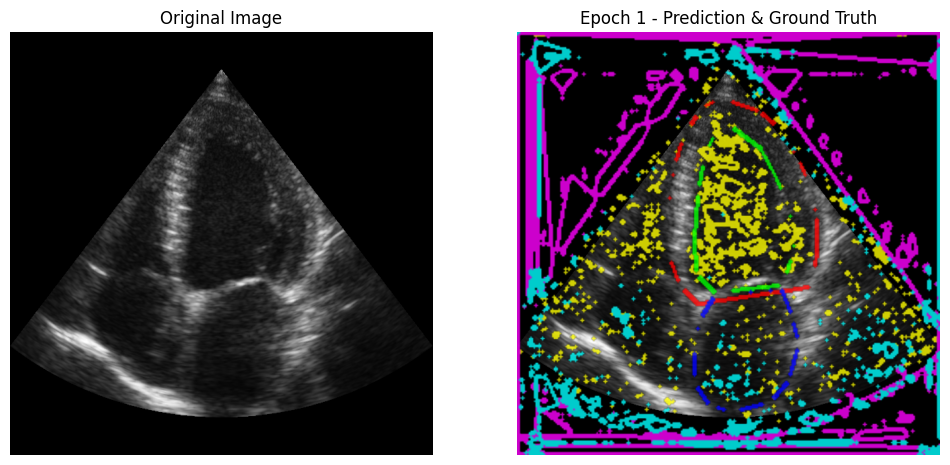

Epoch 2/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]


Train Loss: 0.6685, Train Dice: 0.4933
Val Loss: 0.6682, Val Dice: 0.6090
Model saved!


<Figure size 640x480 with 0 Axes>

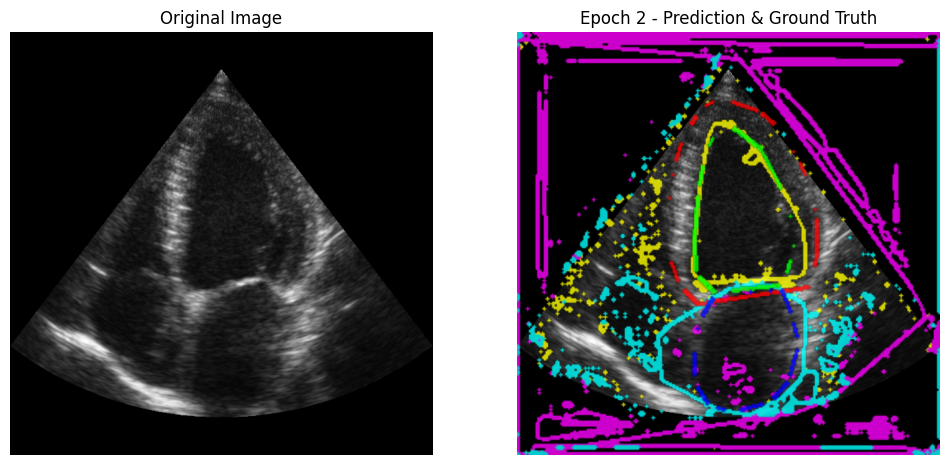

Epoch 3/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.5750, Train Dice: 0.6751
Val Loss: 0.5196, Val Dice: 0.7098
Model saved!


<Figure size 640x480 with 0 Axes>

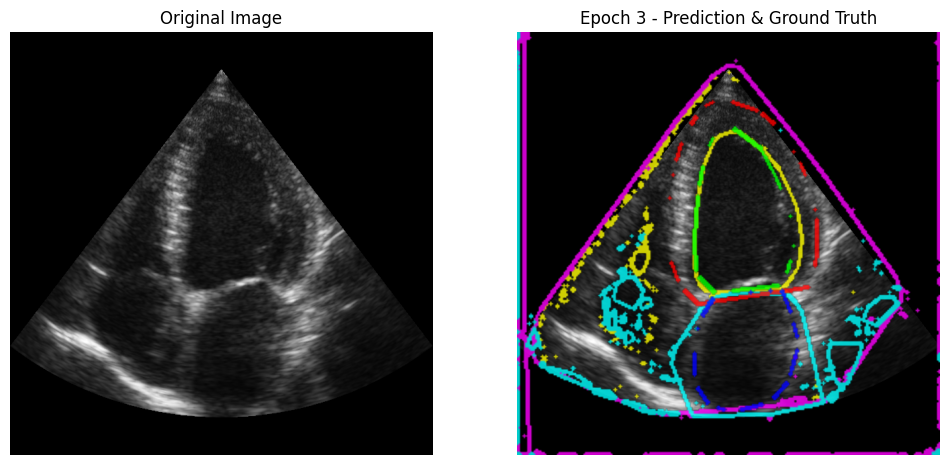

Epoch 4/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.5191, Train Dice: 0.7282
Val Loss: 0.4849, Val Dice: 0.7364
Model saved!


<Figure size 640x480 with 0 Axes>

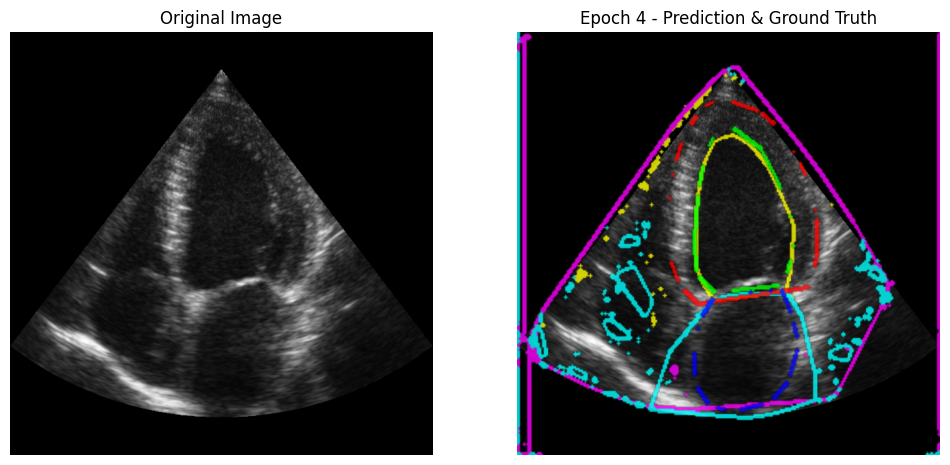

Epoch 5/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]


Train Loss: 0.4891, Train Dice: 0.7592
Val Loss: 0.4689, Val Dice: 0.7665
Model saved!


<Figure size 640x480 with 0 Axes>

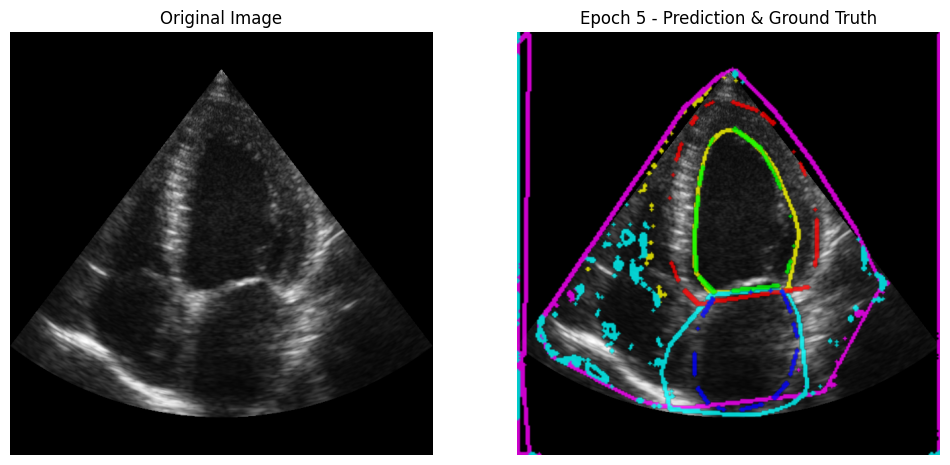

Epoch 6/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.4660, Train Dice: 0.7797
Val Loss: 0.4494, Val Dice: 0.7813
Model saved!


<Figure size 640x480 with 0 Axes>

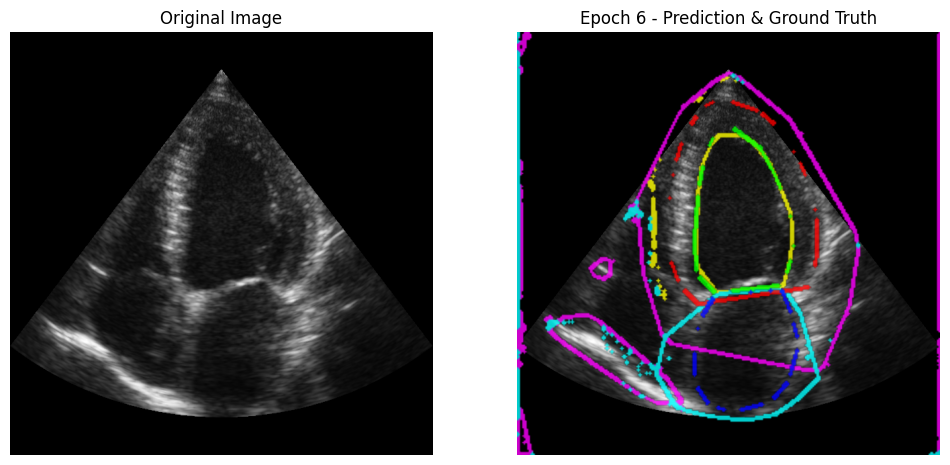

Epoch 7/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


Train Loss: 0.4489, Train Dice: 0.8041
Val Loss: 0.4313, Val Dice: 0.8136
Model saved!


<Figure size 640x480 with 0 Axes>

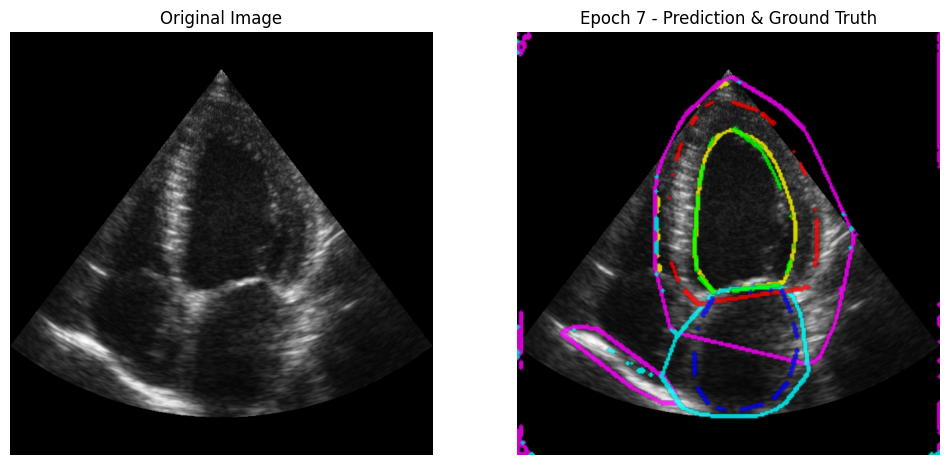

Epoch 8/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Train Loss: 0.4356, Train Dice: 0.8213
Val Loss: 0.4221, Val Dice: 0.8261
Model saved!


<Figure size 640x480 with 0 Axes>

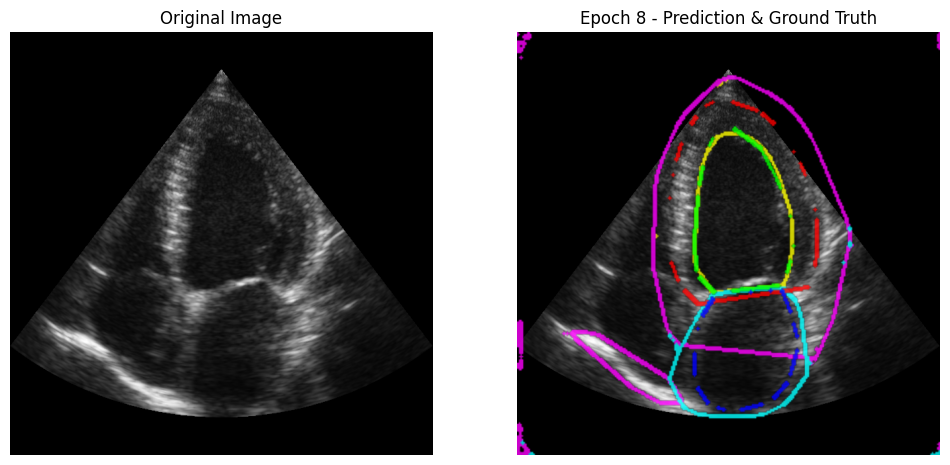

Epoch 9/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]


Train Loss: 0.4243, Train Dice: 0.8346
Val Loss: 0.4106, Val Dice: 0.8389
Model saved!


<Figure size 640x480 with 0 Axes>

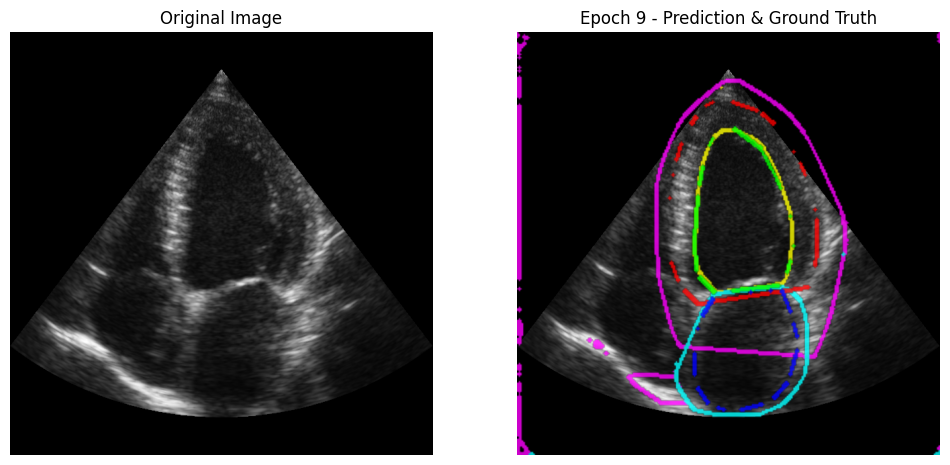

Epoch 10/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]


Train Loss: 0.4159, Train Dice: 0.8470
Val Loss: 0.4009, Val Dice: 0.8532
Model saved!


<Figure size 640x480 with 0 Axes>

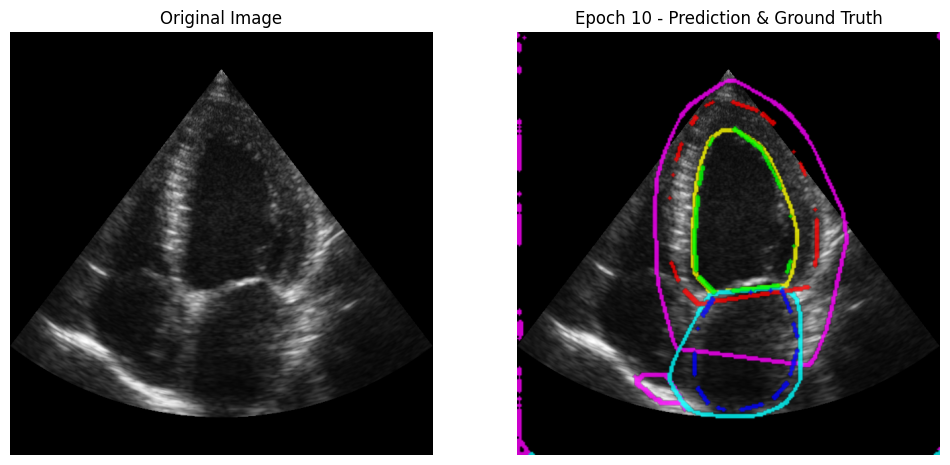

Epoch 11/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.4060, Train Dice: 0.8596
Val Loss: 0.3968, Val Dice: 0.8636
Model saved!


<Figure size 640x480 with 0 Axes>

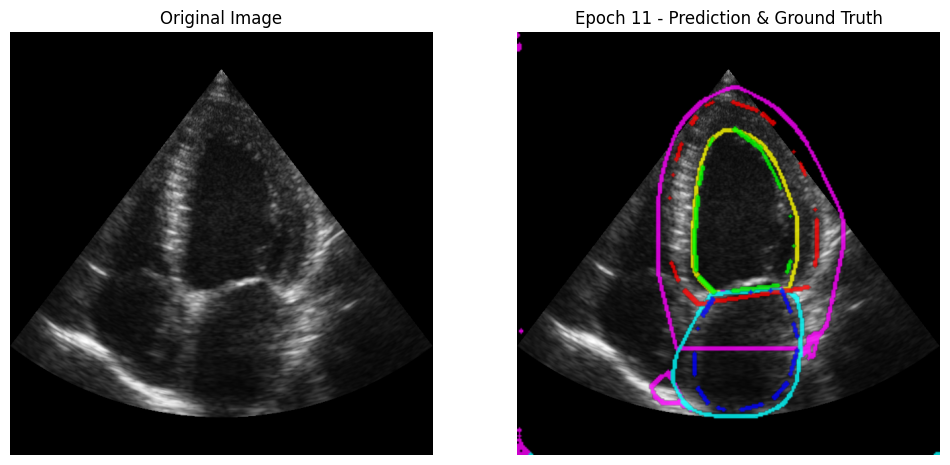

Epoch 12/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]


Train Loss: 0.3995, Train Dice: 0.8706
Val Loss: 0.3933, Val Dice: 0.8730
Model saved!


<Figure size 640x480 with 0 Axes>

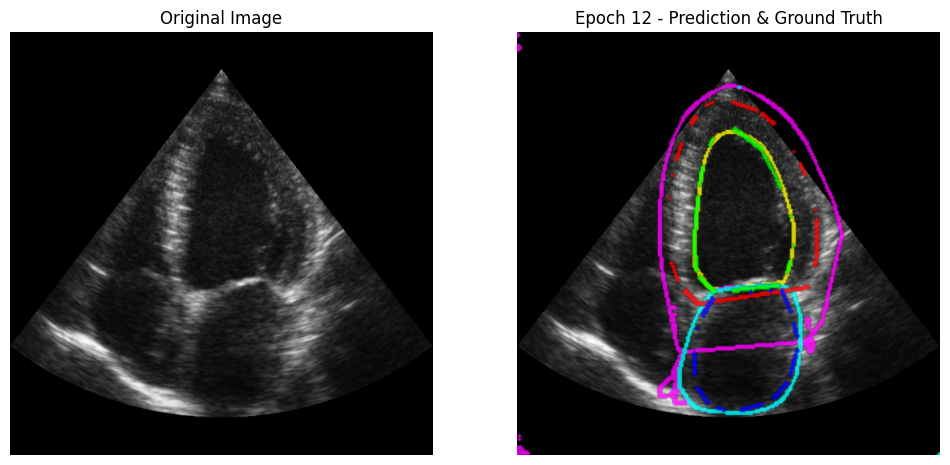

Epoch 13/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3995, Train Dice: 0.8751
Val Loss: 0.3878, Val Dice: 0.8839
Model saved!


<Figure size 640x480 with 0 Axes>

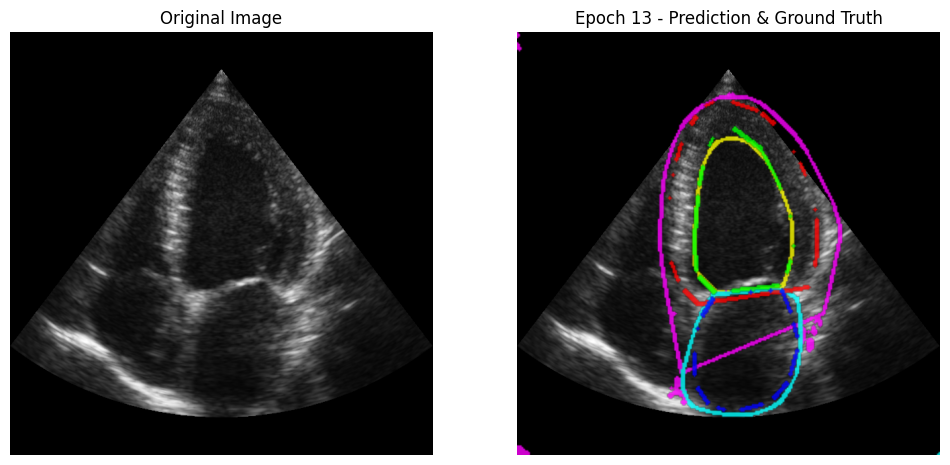

Epoch 14/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.45s/it]


Train Loss: 0.3893, Train Dice: 0.8846
Val Loss: 0.3840, Val Dice: 0.8813
Model saved!


<Figure size 640x480 with 0 Axes>

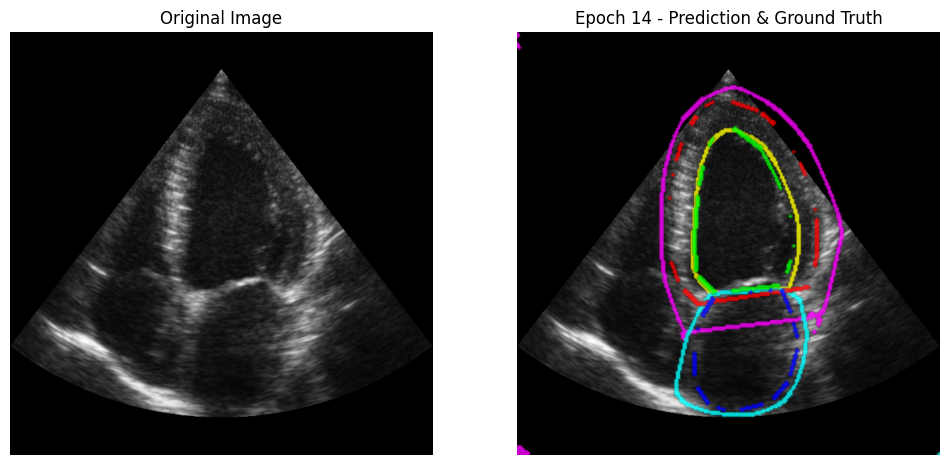

Epoch 15/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3830, Train Dice: 0.8925
Val Loss: 0.3883, Val Dice: 0.8759
Epoch 16/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.3804, Train Dice: 0.8944
Val Loss: 0.3851, Val Dice: 0.8907
Epoch 17/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3768, Train Dice: 0.9006
Val Loss: 0.3795, Val Dice: 0.8962
Model saved!


<Figure size 640x480 with 0 Axes>

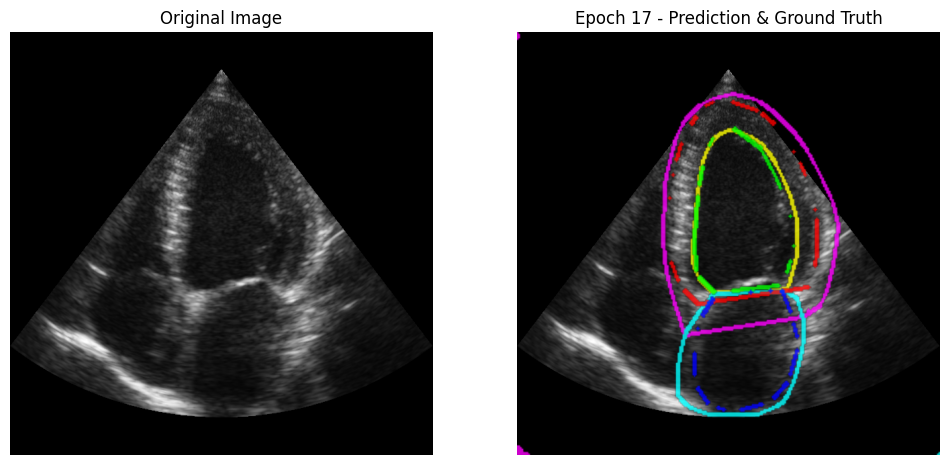

Epoch 18/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3696, Train Dice: 0.9049
Val Loss: 0.3637, Val Dice: 0.8997
Model saved!


<Figure size 640x480 with 0 Axes>

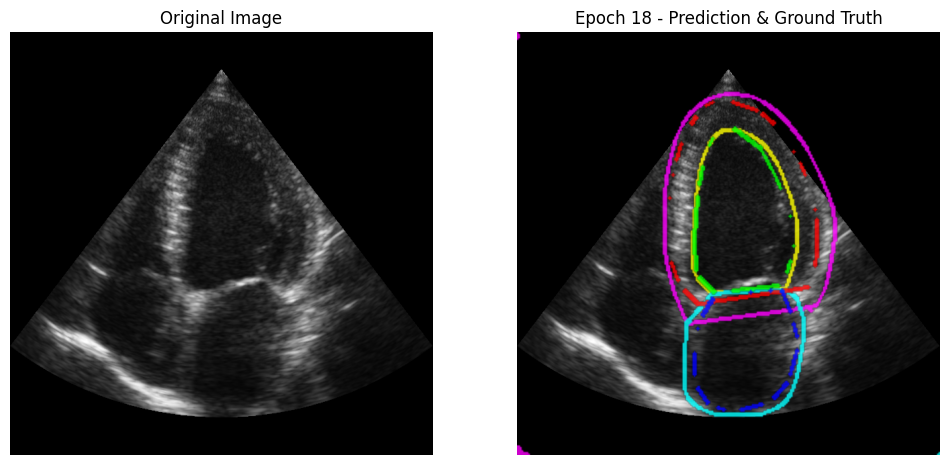

Epoch 19/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]


Train Loss: 0.3619, Train Dice: 0.9101
Val Loss: 0.3537, Val Dice: 0.8958
Model saved!


<Figure size 640x480 with 0 Axes>

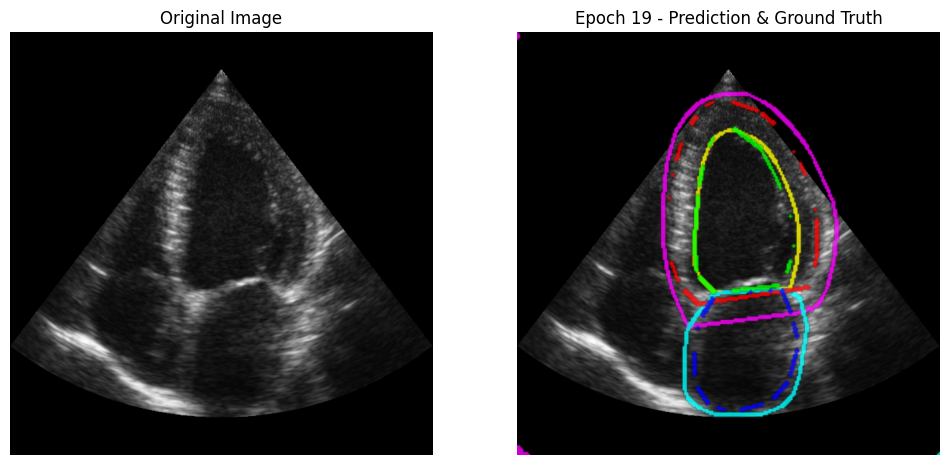

Epoch 20/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]


Train Loss: 0.3682, Train Dice: 0.9083
Val Loss: 0.3814, Val Dice: 0.8882
Epoch 21/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.3568, Train Dice: 0.9116
Val Loss: 0.3121, Val Dice: 0.9080
Model saved!


<Figure size 640x480 with 0 Axes>

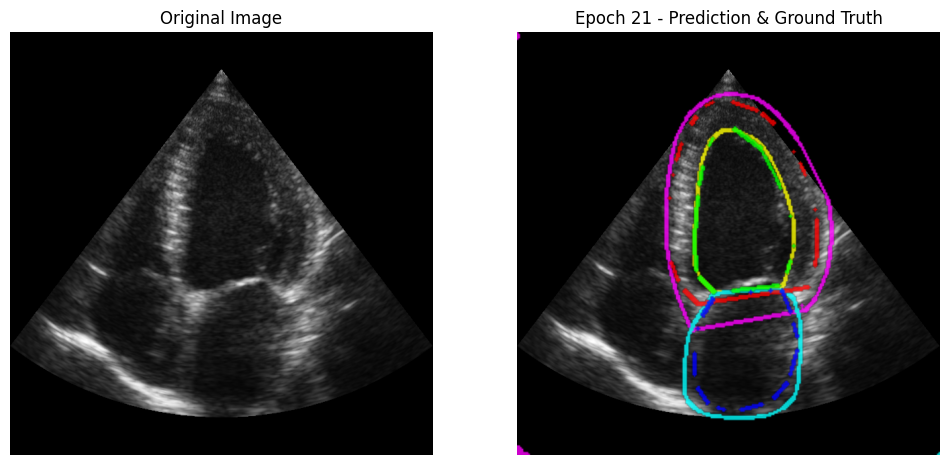

Epoch 22/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]


Train Loss: 0.3553, Train Dice: 0.9146
Val Loss: 0.3621, Val Dice: 0.9029
Epoch 23/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3503, Train Dice: 0.9150
Val Loss: 0.3313, Val Dice: 0.9057
Epoch 24/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3462, Train Dice: 0.9207
Val Loss: 0.3245, Val Dice: 0.9099
Epoch 25/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3381, Train Dice: 0.9219
Val Loss: 0.3215, Val Dice: 0.9156
Epoch 26/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3366, Train Dice: 0.9254
Val Loss: 0.2887, Val Dice: 0.9148
Model saved!


<Figure size 640x480 with 0 Axes>

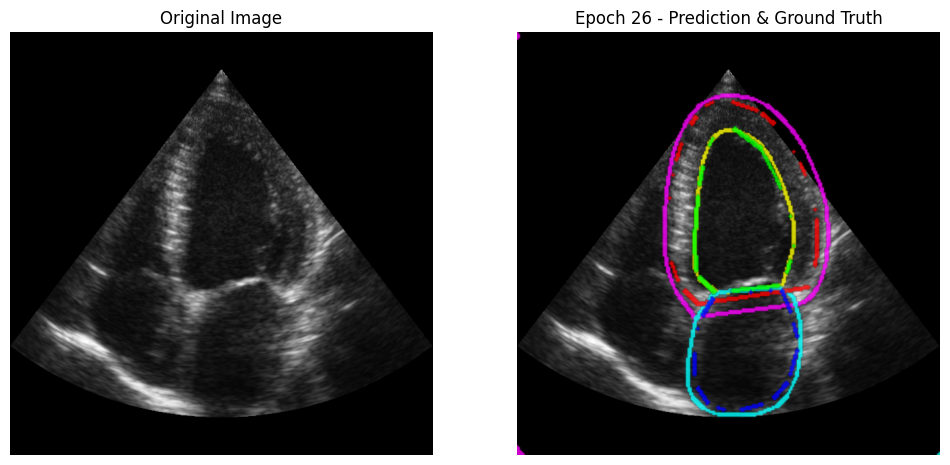

Epoch 27/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.3302, Train Dice: 0.9280
Val Loss: 0.3565, Val Dice: 0.9109
Epoch 28/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3325, Train Dice: 0.9224
Val Loss: 0.2759, Val Dice: 0.9208
Model saved!


<Figure size 640x480 with 0 Axes>

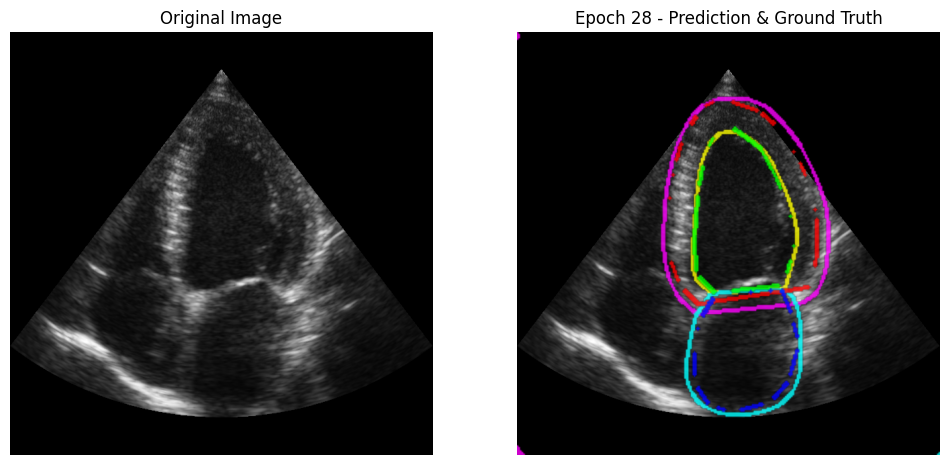

Epoch 29/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3272, Train Dice: 0.9249
Val Loss: 0.2864, Val Dice: 0.9165
Epoch 30/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.3191, Train Dice: 0.9258
Val Loss: 0.2680, Val Dice: 0.9140
Model saved!


<Figure size 640x480 with 0 Axes>

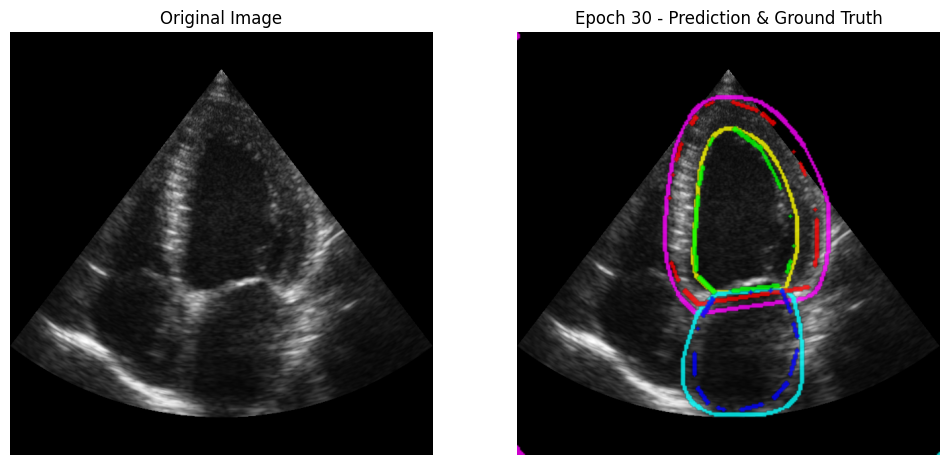

Epoch 31/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.3188, Train Dice: 0.9289
Val Loss: 0.3554, Val Dice: 0.9004
Epoch 32/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3113, Train Dice: 0.9322
Val Loss: 0.4001, Val Dice: 0.9008
Epoch 33/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.3100, Train Dice: 0.9316
Val Loss: 0.2736, Val Dice: 0.9216
Epoch 34/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.3082, Train Dice: 0.9346
Val Loss: 0.2792, Val Dice: 0.9230
Epoch 35/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]


Train Loss: 0.3080, Train Dice: 0.9329
Val Loss: 0.2816, Val Dice: 0.9214
Epoch 36/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]


Train Loss: 0.2997, Train Dice: 0.9371
Val Loss: 0.2949, Val Dice: 0.9195
Epoch 37/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]


Train Loss: 0.3009, Train Dice: 0.9371
Val Loss: 0.2571, Val Dice: 0.9202
Model saved!


<Figure size 640x480 with 0 Axes>

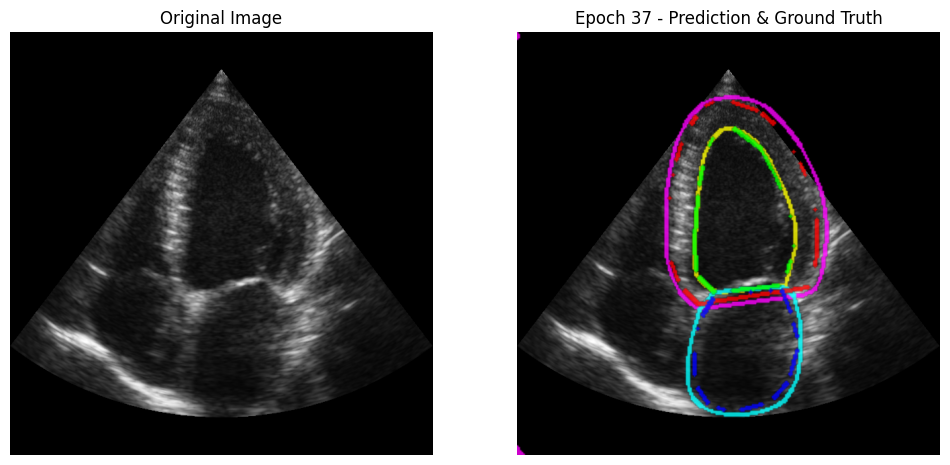

Epoch 38/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.2947, Train Dice: 0.9384
Val Loss: 0.2585, Val Dice: 0.9199
Epoch 39/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2944, Train Dice: 0.9393
Val Loss: 0.2955, Val Dice: 0.9122
Epoch 40/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.2907, Train Dice: 0.9405
Val Loss: 0.2841, Val Dice: 0.9188
Epoch 41/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.2906, Train Dice: 0.9408
Val Loss: 0.2873, Val Dice: 0.9150
Epoch 42/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2869, Train Dice: 0.9414
Val Loss: 0.2357, Val Dice: 0.9264
Model saved!


<Figure size 640x480 with 0 Axes>

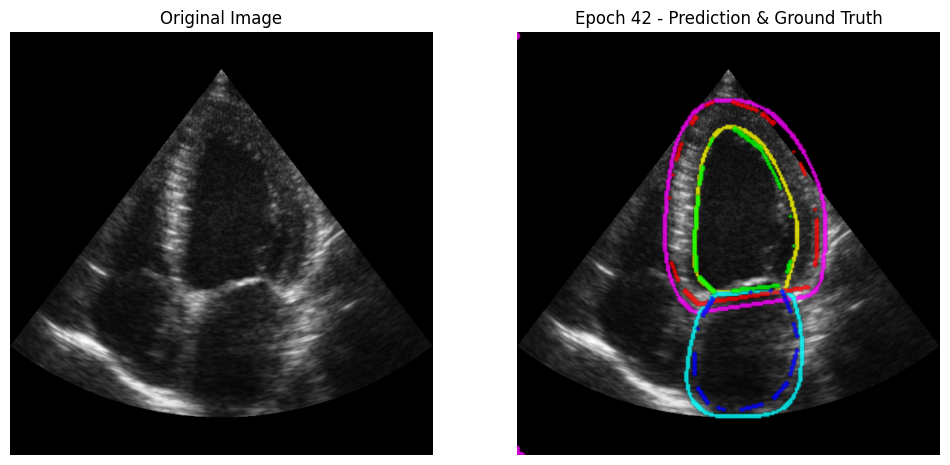

Epoch 43/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]


Train Loss: 0.2834, Train Dice: 0.9421
Val Loss: 0.2353, Val Dice: 0.9259
Model saved!


<Figure size 640x480 with 0 Axes>

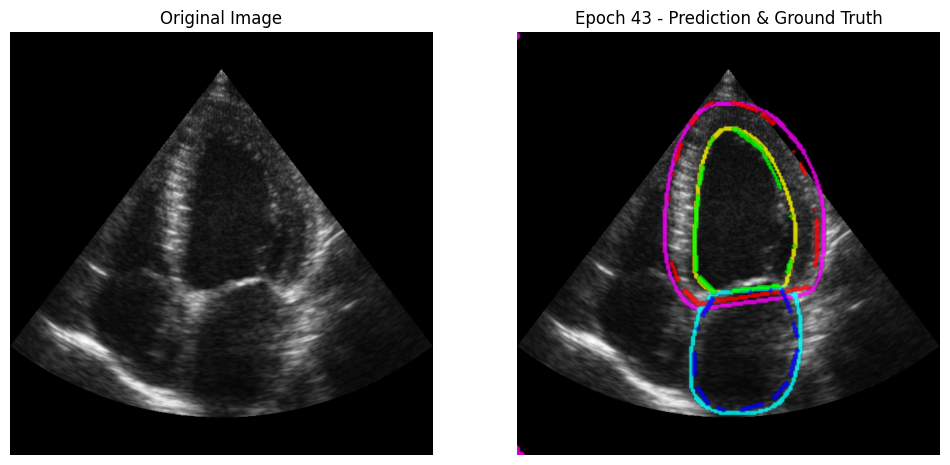

Epoch 44/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2779, Train Dice: 0.9453
Val Loss: 0.2349, Val Dice: 0.9216
Model saved!


<Figure size 640x480 with 0 Axes>

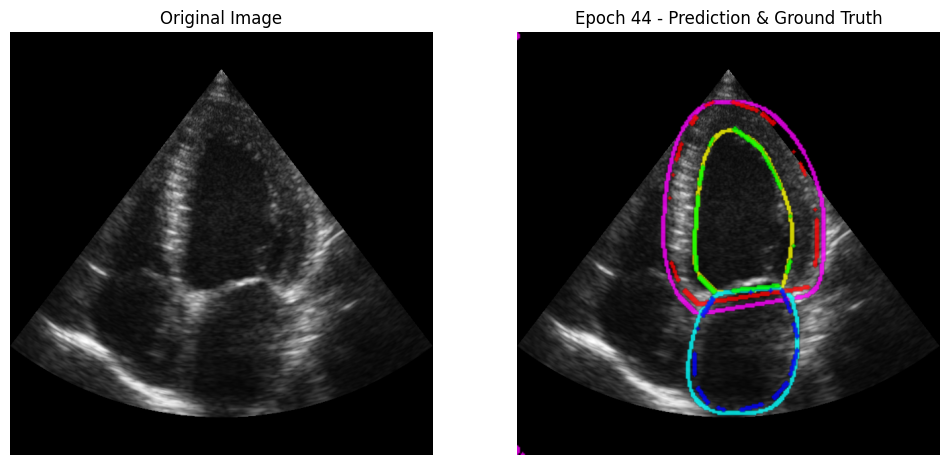

Epoch 45/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.2795, Train Dice: 0.9426
Val Loss: 0.2597, Val Dice: 0.9184
Epoch 46/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Train Loss: 0.2765, Train Dice: 0.9436
Val Loss: 0.2582, Val Dice: 0.9206
Epoch 47/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.2768, Train Dice: 0.9434
Val Loss: 0.2392, Val Dice: 0.9244
Epoch 48/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]


Train Loss: 0.2695, Train Dice: 0.9445
Val Loss: 0.2656, Val Dice: 0.9225
Epoch 49/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.2677, Train Dice: 0.9462
Val Loss: 0.2296, Val Dice: 0.9243
Model saved!


<Figure size 640x480 with 0 Axes>

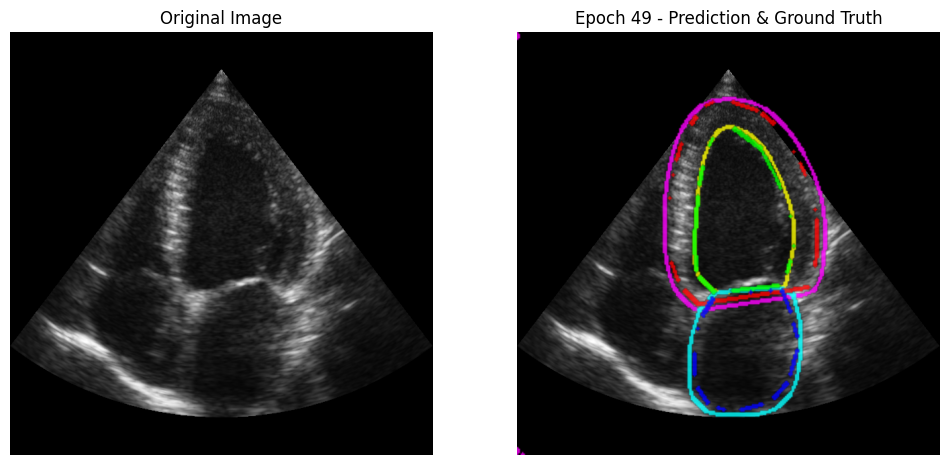

Epoch 50/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.2691, Train Dice: 0.9458
Val Loss: 0.2318, Val Dice: 0.9207
Epoch 51/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]


Train Loss: 0.2602, Train Dice: 0.9467
Val Loss: 0.2381, Val Dice: 0.9276
Epoch 52/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2632, Train Dice: 0.9467
Val Loss: 0.2380, Val Dice: 0.9219
Epoch 53/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.2566, Train Dice: 0.9498
Val Loss: 0.2528, Val Dice: 0.9244
Epoch 54/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2520, Train Dice: 0.9510
Val Loss: 0.2270, Val Dice: 0.9252
Model saved!


<Figure size 640x480 with 0 Axes>

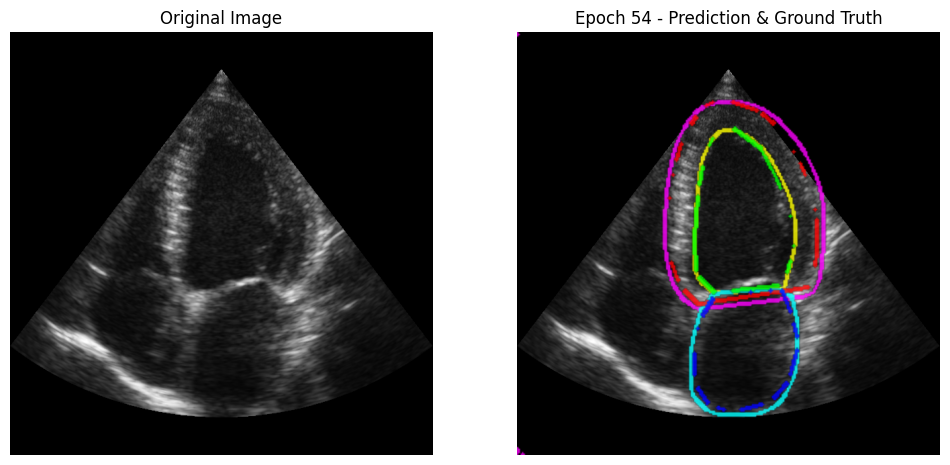

Epoch 55/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Train Loss: 0.2504, Train Dice: 0.9517
Val Loss: 0.2265, Val Dice: 0.9223
Model saved!


<Figure size 640x480 with 0 Axes>

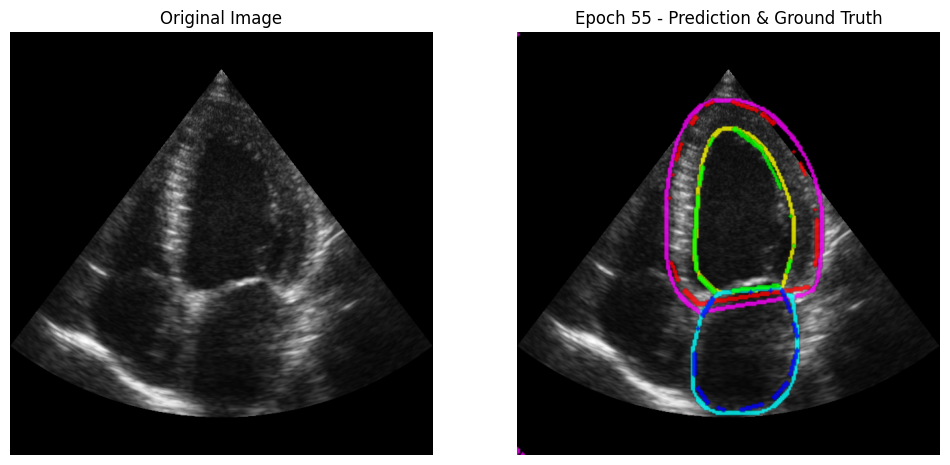

Epoch 56/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.2485, Train Dice: 0.9515
Val Loss: 0.2332, Val Dice: 0.9255
Epoch 57/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.2456, Train Dice: 0.9536
Val Loss: 0.2379, Val Dice: 0.9266
Epoch 58/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.2415, Train Dice: 0.9553
Val Loss: 0.2376, Val Dice: 0.9192
Epoch 59/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.54s/it]


Train Loss: 0.2432, Train Dice: 0.9515
Val Loss: 0.2131, Val Dice: 0.9260
Model saved!


<Figure size 640x480 with 0 Axes>

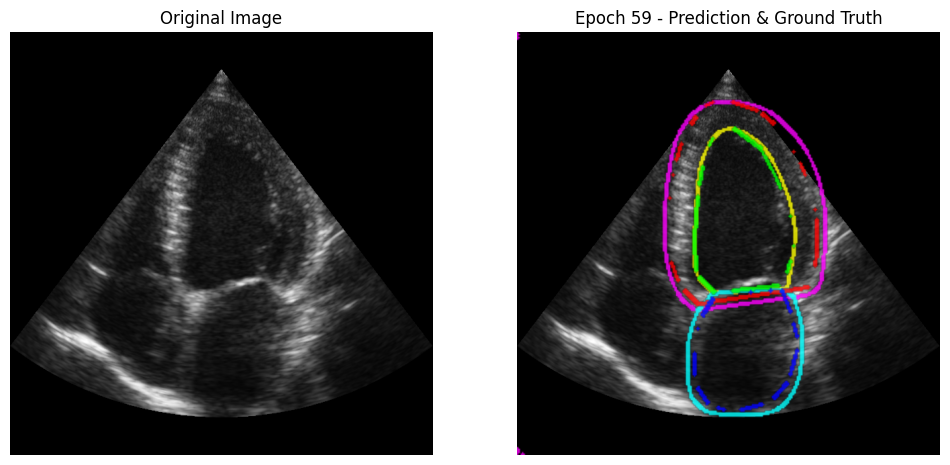

Epoch 60/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.2407, Train Dice: 0.9513
Val Loss: 0.2360, Val Dice: 0.9221
Epoch 61/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.2371, Train Dice: 0.9522
Val Loss: 0.2288, Val Dice: 0.9251
Epoch 62/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.54s/it]


Train Loss: 0.2348, Train Dice: 0.9540
Val Loss: 0.2512, Val Dice: 0.9212
Epoch 63/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2318, Train Dice: 0.9551
Val Loss: 0.2322, Val Dice: 0.9237
Epoch 64/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]


Train Loss: 0.2285, Train Dice: 0.9564
Val Loss: 0.2138, Val Dice: 0.9258
Epoch 65/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.2269, Train Dice: 0.9557
Val Loss: 0.2120, Val Dice: 0.9226
Model saved!


<Figure size 640x480 with 0 Axes>

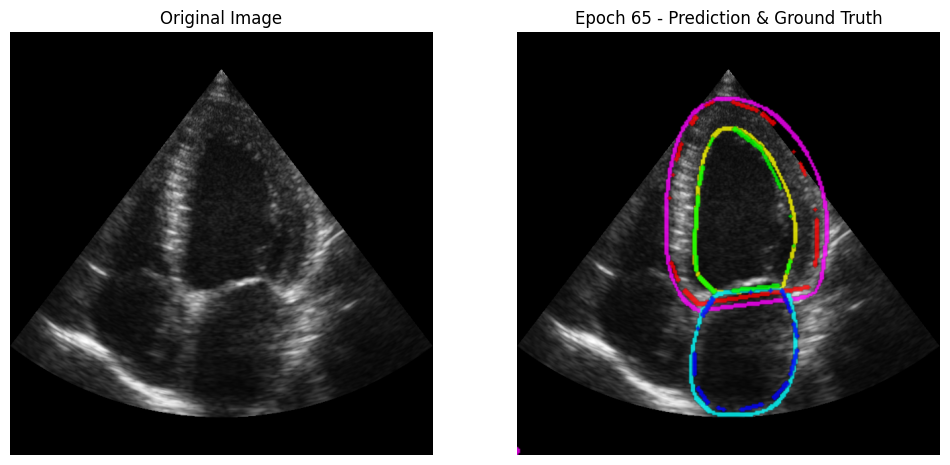

Epoch 66/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Train Loss: 0.2279, Train Dice: 0.9561
Val Loss: 0.2104, Val Dice: 0.9210
Model saved!


<Figure size 640x480 with 0 Axes>

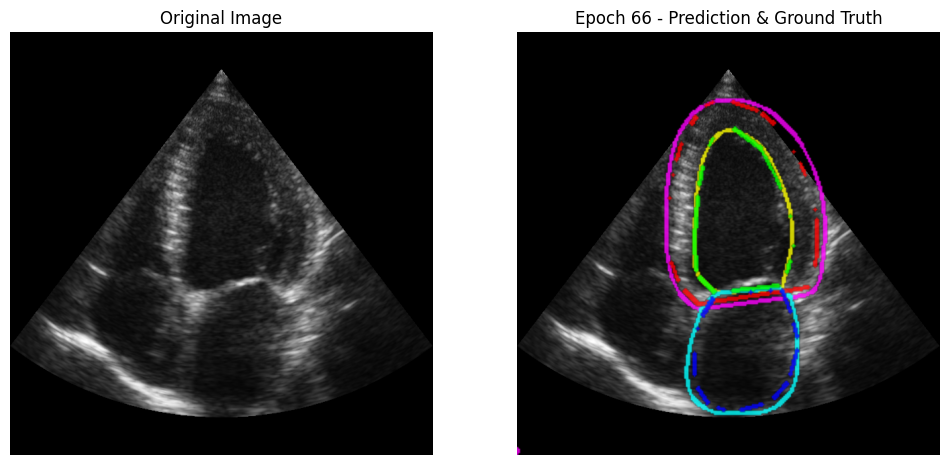

Epoch 67/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]


Train Loss: 0.2268, Train Dice: 0.9546
Val Loss: 0.2149, Val Dice: 0.9234
Epoch 68/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2209, Train Dice: 0.9571
Val Loss: 0.2090, Val Dice: 0.9276
Model saved!


<Figure size 640x480 with 0 Axes>

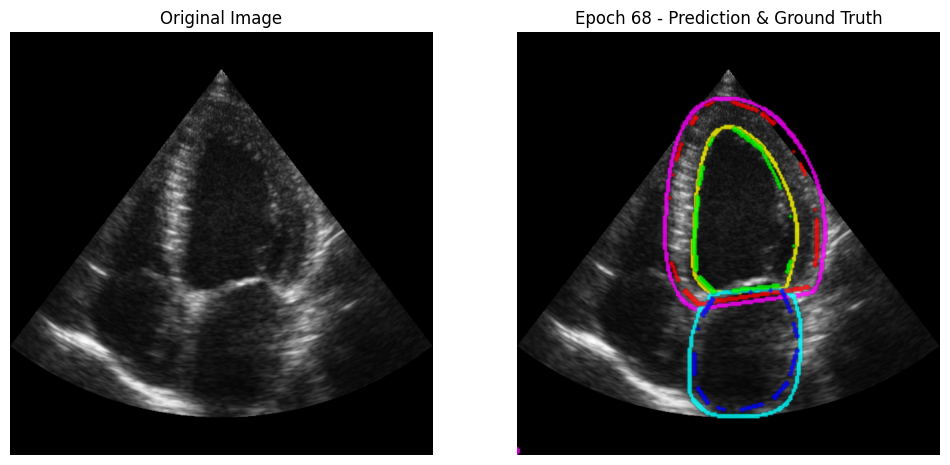

Epoch 69/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.2169, Train Dice: 0.9587
Val Loss: 0.2206, Val Dice: 0.9257
Epoch 70/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]


Train Loss: 0.2134, Train Dice: 0.9595
Val Loss: 0.2043, Val Dice: 0.9279
Model saved!


<Figure size 640x480 with 0 Axes>

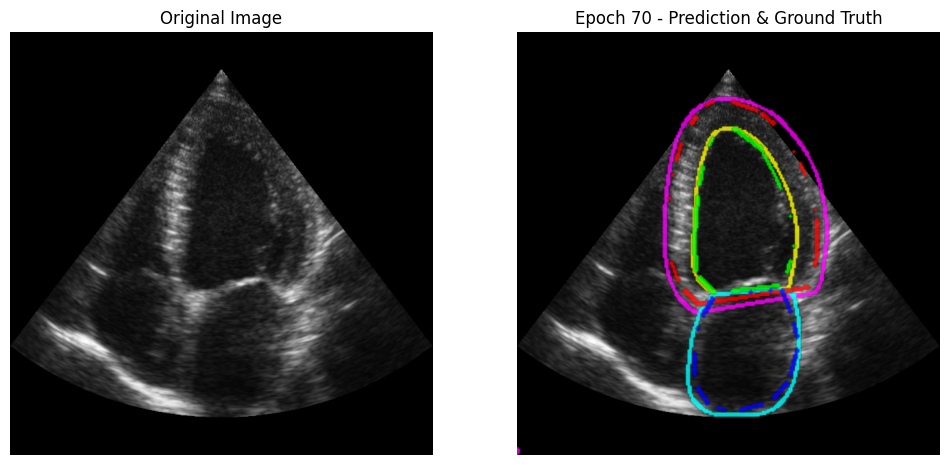

Epoch 71/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2153, Train Dice: 0.9574
Val Loss: 0.1954, Val Dice: 0.9274
Model saved!


<Figure size 640x480 with 0 Axes>

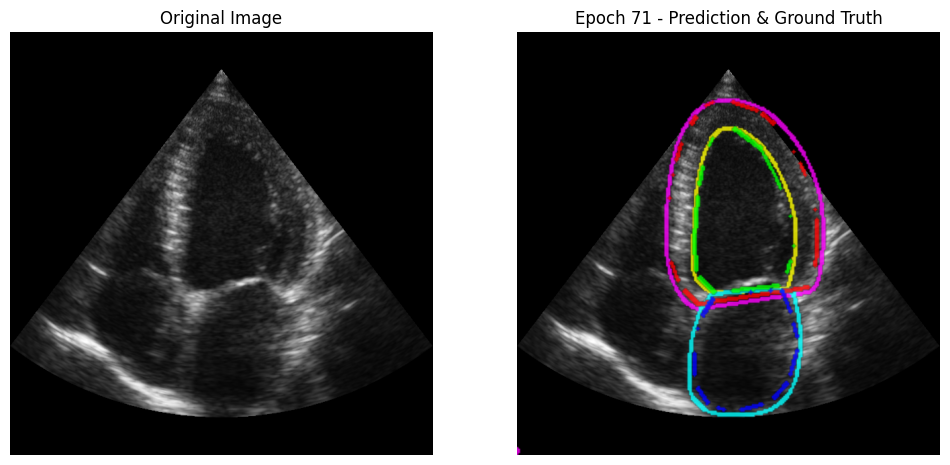

Epoch 72/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2143, Train Dice: 0.9593
Val Loss: 0.2040, Val Dice: 0.9254
Epoch 73/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]


Train Loss: 0.2113, Train Dice: 0.9590
Val Loss: 0.2017, Val Dice: 0.9181
Epoch 74/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.2082, Train Dice: 0.9558
Val Loss: 0.2048, Val Dice: 0.9232
Epoch 75/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.2073, Train Dice: 0.9609
Val Loss: 0.1970, Val Dice: 0.9246
Epoch 76/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.2039, Train Dice: 0.9611
Val Loss: 0.1916, Val Dice: 0.9247
Model saved!


<Figure size 640x480 with 0 Axes>

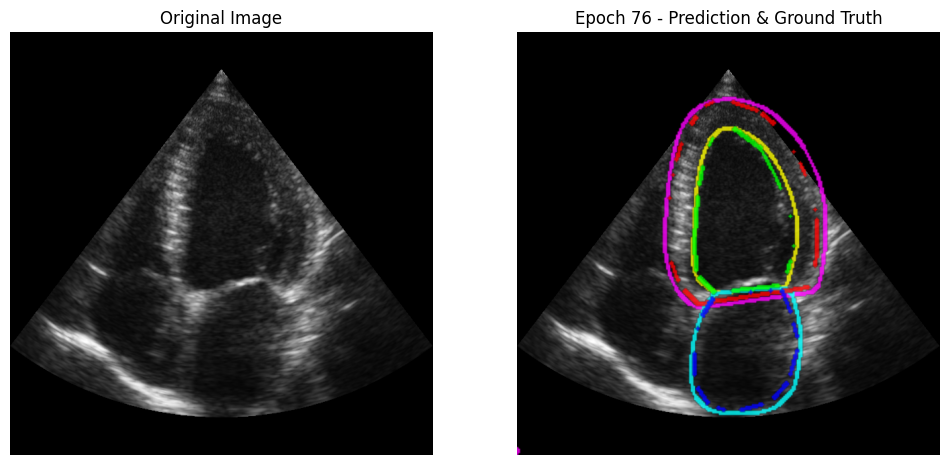

Epoch 77/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.1999, Train Dice: 0.9602
Val Loss: 0.2036, Val Dice: 0.9255
Epoch 78/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]


Train Loss: 0.1999, Train Dice: 0.9599
Val Loss: 0.1967, Val Dice: 0.9272
Epoch 79/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Train Loss: 0.1956, Train Dice: 0.9610
Val Loss: 0.1915, Val Dice: 0.9255
Model saved!


<Figure size 640x480 with 0 Axes>

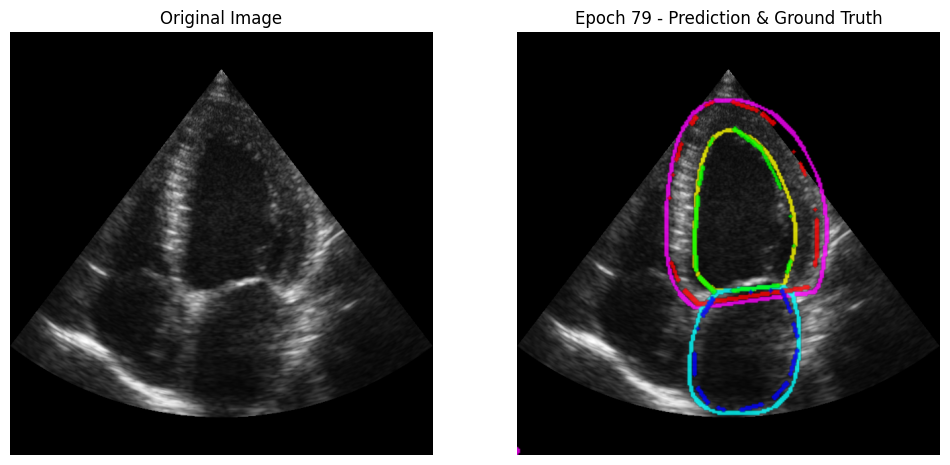

Epoch 80/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.1927, Train Dice: 0.9619
Val Loss: 0.1853, Val Dice: 0.9263
Model saved!


<Figure size 640x480 with 0 Axes>

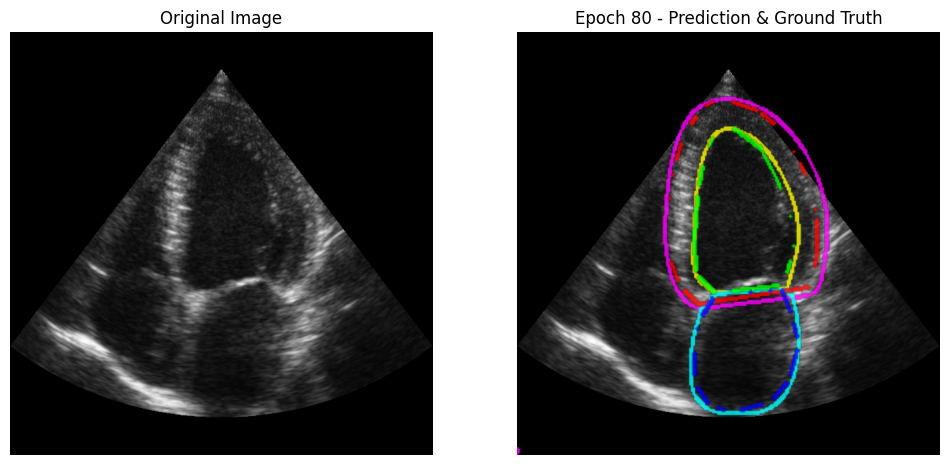

Epoch 81/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.1891, Train Dice: 0.9651
Val Loss: 0.1801, Val Dice: 0.9281
Model saved!


<Figure size 640x480 with 0 Axes>

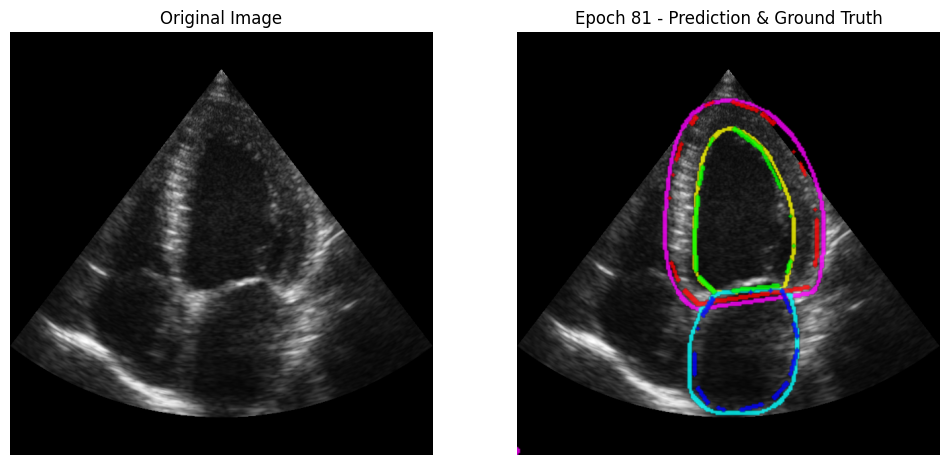

Epoch 82/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]


Train Loss: 0.1894, Train Dice: 0.9614
Val Loss: 0.2007, Val Dice: 0.9241
Epoch 83/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1895, Train Dice: 0.9621
Val Loss: 0.1908, Val Dice: 0.9272
Epoch 84/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]


Train Loss: 0.1836, Train Dice: 0.9636
Val Loss: 0.1832, Val Dice: 0.9282
Epoch 85/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.1849, Train Dice: 0.9644
Val Loss: 0.1811, Val Dice: 0.9278
Epoch 86/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.1801, Train Dice: 0.9648
Val Loss: 0.1861, Val Dice: 0.9283
Epoch 87/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.1779, Train Dice: 0.9668
Val Loss: 0.1819, Val Dice: 0.9292
Epoch 88/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1743, Train Dice: 0.9661
Val Loss: 0.1778, Val Dice: 0.9288
Model saved!


<Figure size 640x480 with 0 Axes>

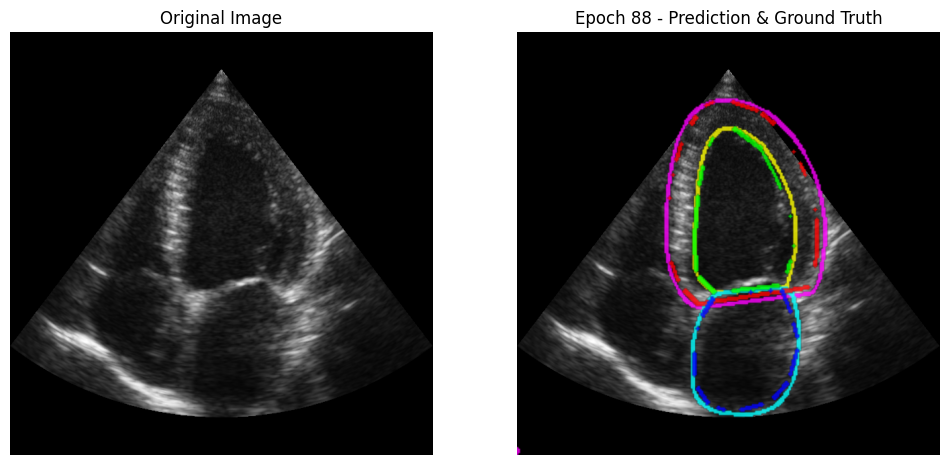

Epoch 89/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]


Train Loss: 0.1755, Train Dice: 0.9666
Val Loss: 0.1777, Val Dice: 0.9281
Model saved!


<Figure size 640x480 with 0 Axes>

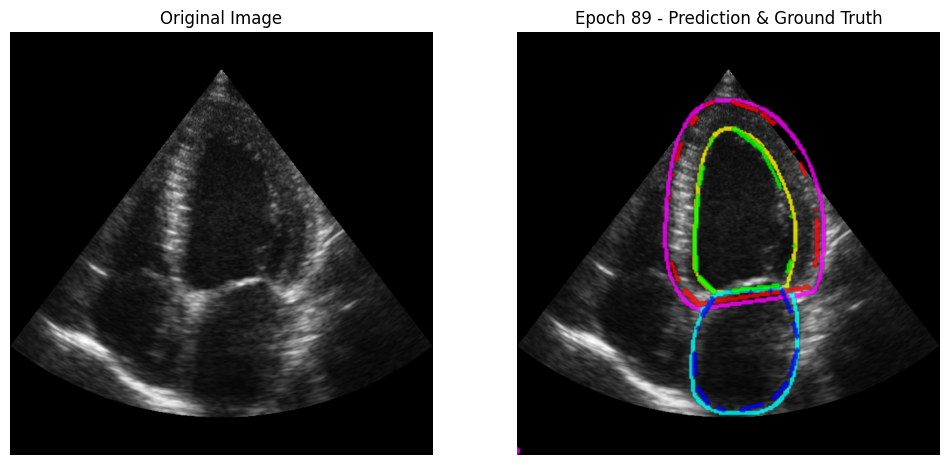

Epoch 90/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1711, Train Dice: 0.9673
Val Loss: 0.1777, Val Dice: 0.9271
Epoch 91/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.1699, Train Dice: 0.9683
Val Loss: 0.1731, Val Dice: 0.9293
Model saved!


<Figure size 640x480 with 0 Axes>

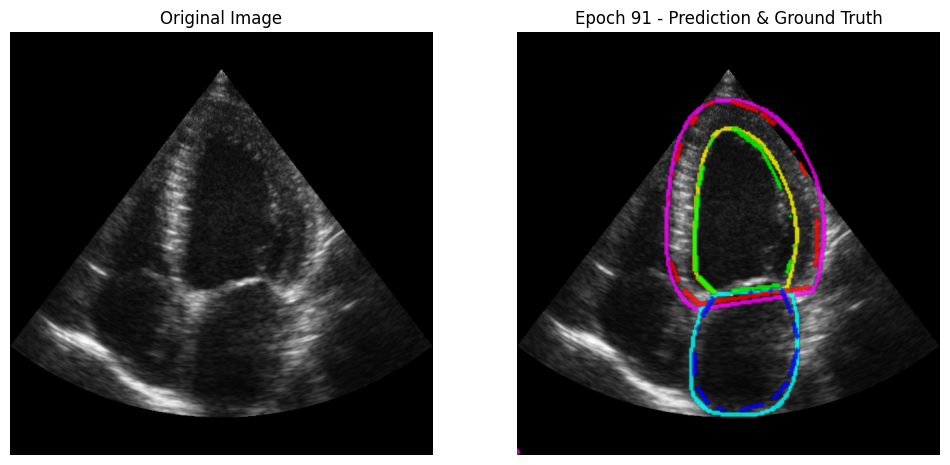

Epoch 92/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.1684, Train Dice: 0.9683
Val Loss: 0.1716, Val Dice: 0.9274
Model saved!


<Figure size 640x480 with 0 Axes>

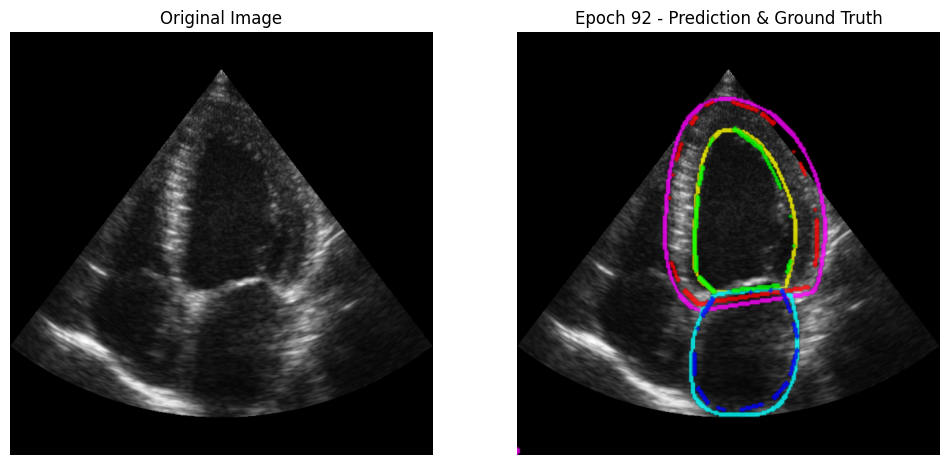

Epoch 93/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.1640, Train Dice: 0.9693
Val Loss: 0.1736, Val Dice: 0.9256
Epoch 94/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]


Train Loss: 0.1644, Train Dice: 0.9689
Val Loss: 0.1715, Val Dice: 0.9282
Model saved!


<Figure size 640x480 with 0 Axes>

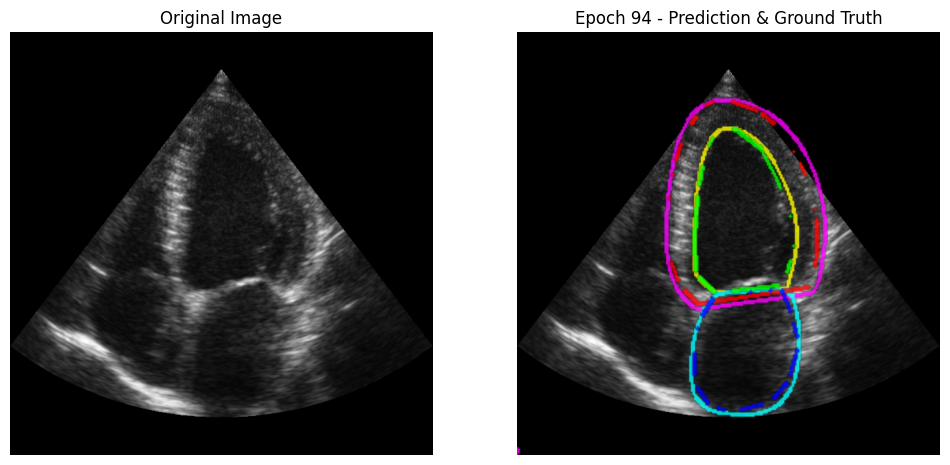

Epoch 95/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]


Train Loss: 0.1631, Train Dice: 0.9685
Val Loss: 0.1822, Val Dice: 0.9265
Epoch 96/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.1571, Train Dice: 0.9676
Val Loss: 0.1762, Val Dice: 0.9275
Epoch 97/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]


Train Loss: 0.1564, Train Dice: 0.9693
Val Loss: 0.1775, Val Dice: 0.9274
Epoch 98/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.1554, Train Dice: 0.9698
Val Loss: 0.1769, Val Dice: 0.9263
Epoch 99/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.1534, Train Dice: 0.9698
Val Loss: 0.1730, Val Dice: 0.9295
Epoch 100/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]


Train Loss: 0.1519, Train Dice: 0.9708
Val Loss: 0.1715, Val Dice: 0.9268
Epoch 101/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.1468, Train Dice: 0.9708
Val Loss: 0.1724, Val Dice: 0.9283
Epoch 102/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Train Loss: 0.1462, Train Dice: 0.9707
Val Loss: 0.1710, Val Dice: 0.9268
Model saved!


<Figure size 640x480 with 0 Axes>

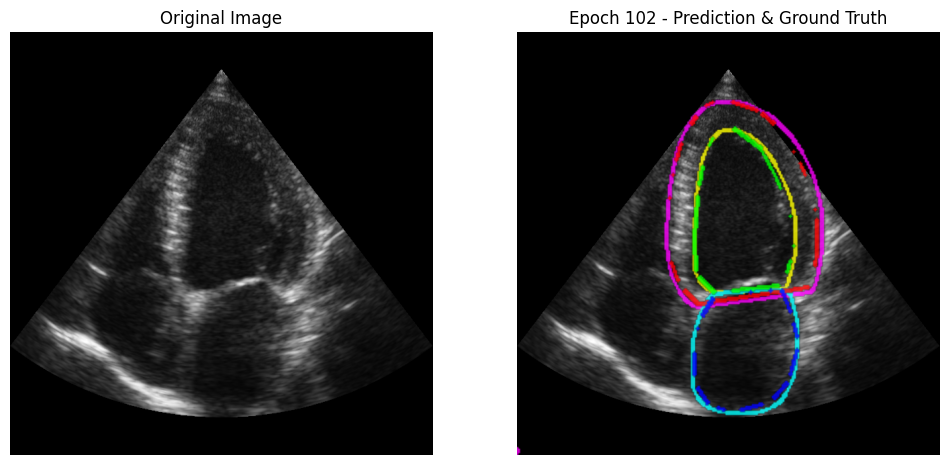

Epoch 103/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Train Loss: 0.1445, Train Dice: 0.9715
Val Loss: 0.1717, Val Dice: 0.9283
Epoch 104/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1471, Train Dice: 0.9711
Val Loss: 0.1674, Val Dice: 0.9276
Model saved!


<Figure size 640x480 with 0 Axes>

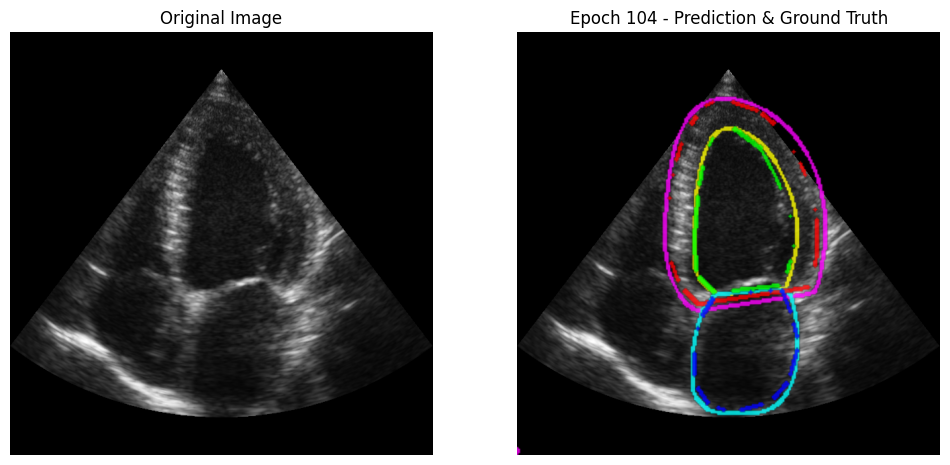

Epoch 105/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Train Loss: 0.1420, Train Dice: 0.9714
Val Loss: 0.1630, Val Dice: 0.9281
Model saved!


<Figure size 640x480 with 0 Axes>

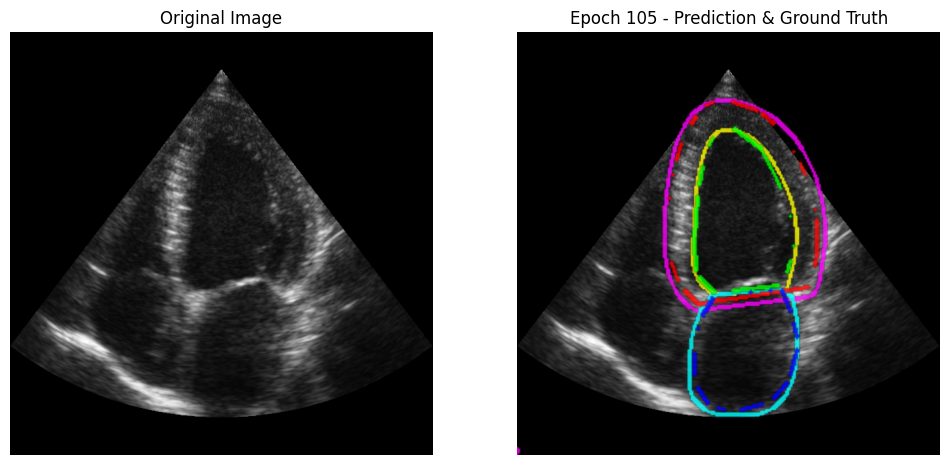

Epoch 106/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.1383, Train Dice: 0.9721
Val Loss: 0.1713, Val Dice: 0.9269
Epoch 107/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.1414, Train Dice: 0.9680
Val Loss: 0.1689, Val Dice: 0.9247
Epoch 108/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]


Train Loss: 0.1355, Train Dice: 0.9705
Val Loss: 0.1672, Val Dice: 0.9272
Epoch 109/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1355, Train Dice: 0.9709
Val Loss: 0.1640, Val Dice: 0.9280
Epoch 110/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]


Train Loss: 0.1342, Train Dice: 0.9711
Val Loss: 0.1660, Val Dice: 0.9273
Epoch 111/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.71s/it]


Train Loss: 0.1301, Train Dice: 0.9727
Val Loss: 0.1629, Val Dice: 0.9271
Model saved!


<Figure size 640x480 with 0 Axes>

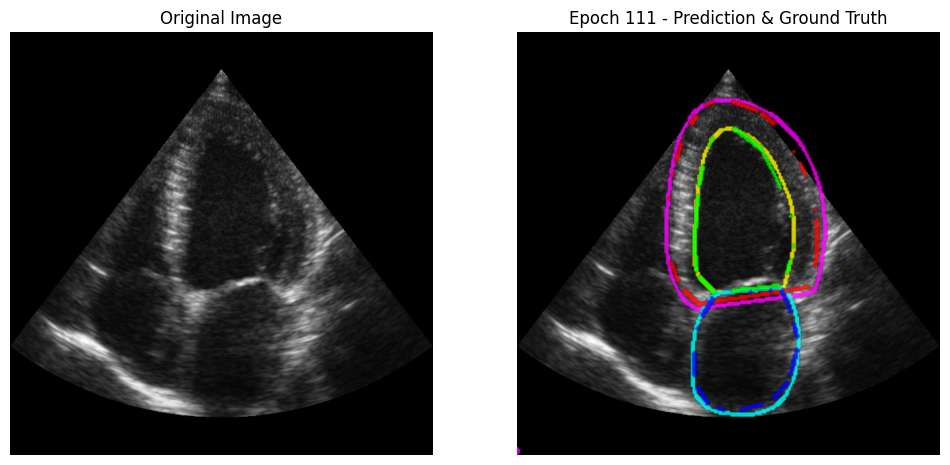

Epoch 112/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1273, Train Dice: 0.9745
Val Loss: 0.1620, Val Dice: 0.9295
Model saved!


<Figure size 640x480 with 0 Axes>

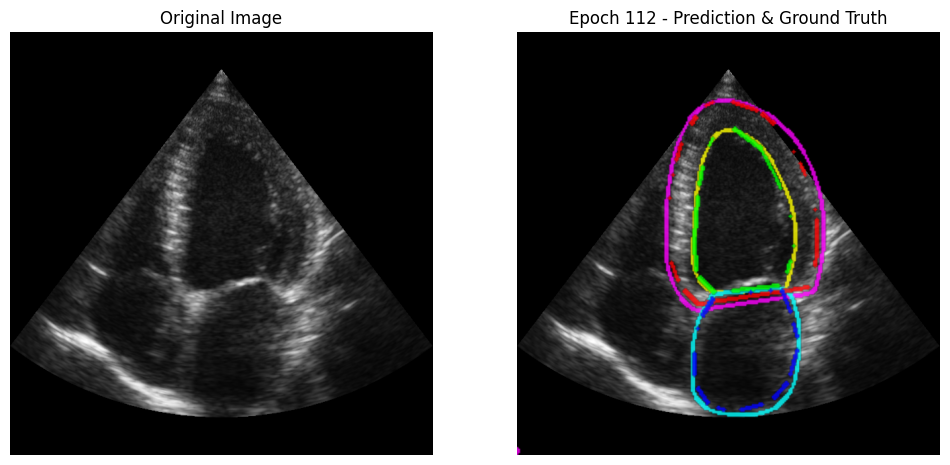

Epoch 113/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.1226, Train Dice: 0.9745
Val Loss: 0.1578, Val Dice: 0.9292
Model saved!


<Figure size 640x480 with 0 Axes>

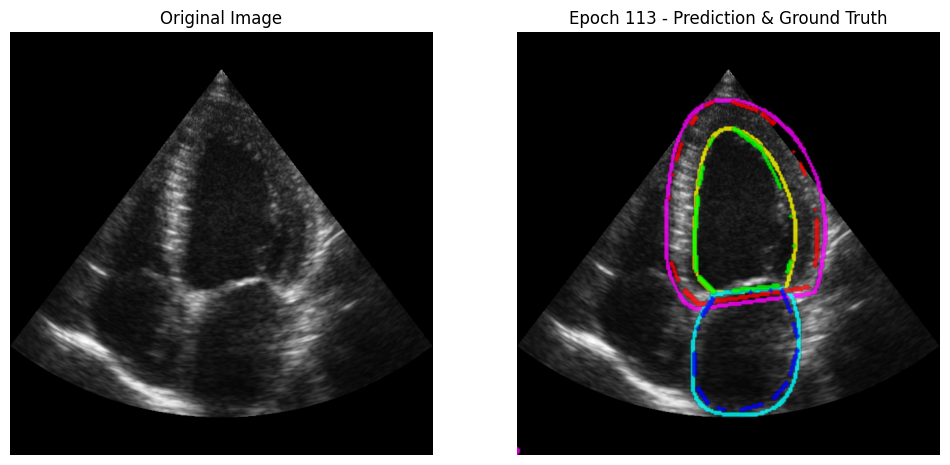

Epoch 114/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]


Train Loss: 0.1213, Train Dice: 0.9753
Val Loss: 0.1566, Val Dice: 0.9286
Model saved!


<Figure size 640x480 with 0 Axes>

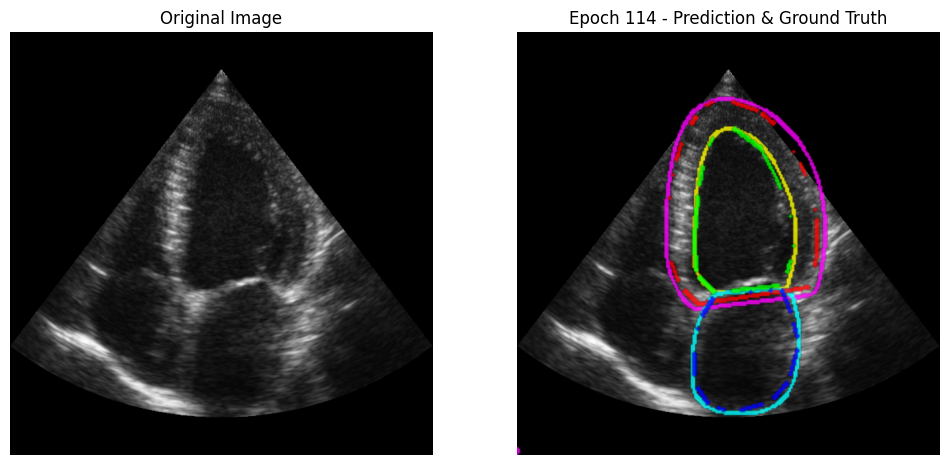

Epoch 115/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Train Loss: 0.1205, Train Dice: 0.9748
Val Loss: 0.1577, Val Dice: 0.9273
Epoch 116/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]


Train Loss: 0.1222, Train Dice: 0.9743
Val Loss: 0.1593, Val Dice: 0.9264
Epoch 117/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Train Loss: 0.1205, Train Dice: 0.9743
Val Loss: 0.1531, Val Dice: 0.9296
Model saved!


<Figure size 640x480 with 0 Axes>

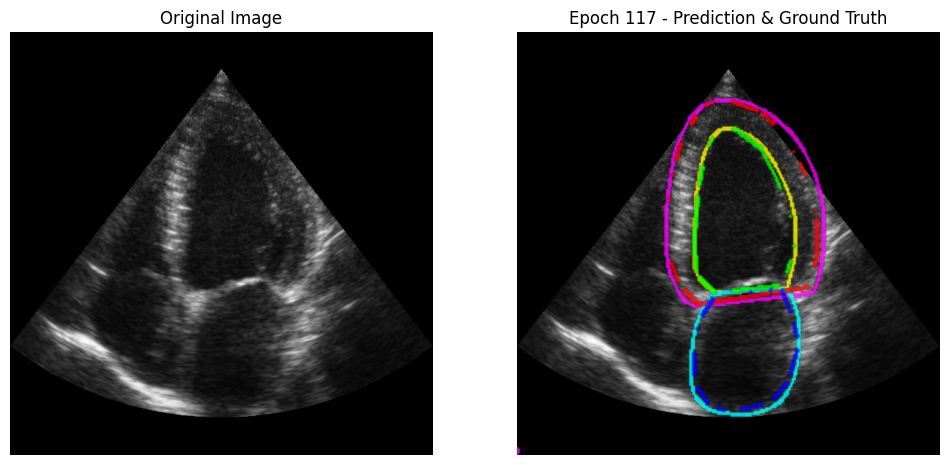

Epoch 118/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.1178, Train Dice: 0.9753
Val Loss: 0.1579, Val Dice: 0.9266
Epoch 119/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.1161, Train Dice: 0.9740
Val Loss: 0.1505, Val Dice: 0.9286
Model saved!


<Figure size 640x480 with 0 Axes>

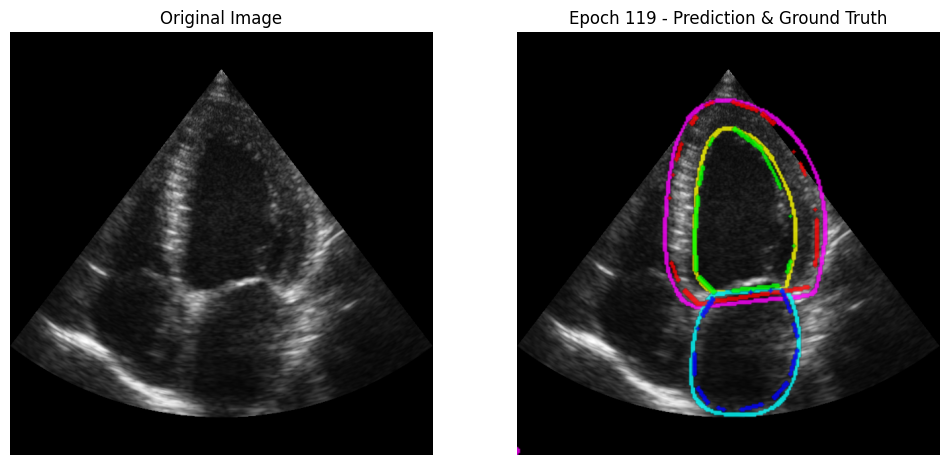

Epoch 120/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]


Train Loss: 0.1117, Train Dice: 0.9753
Val Loss: 0.1490, Val Dice: 0.9291
Model saved!


<Figure size 640x480 with 0 Axes>

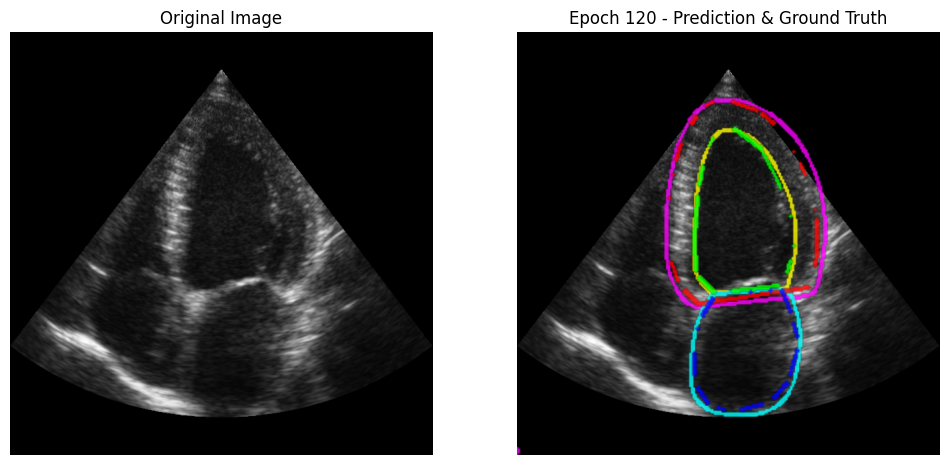

Epoch 121/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.1107, Train Dice: 0.9757
Val Loss: 0.1473, Val Dice: 0.9292
Model saved!


<Figure size 640x480 with 0 Axes>

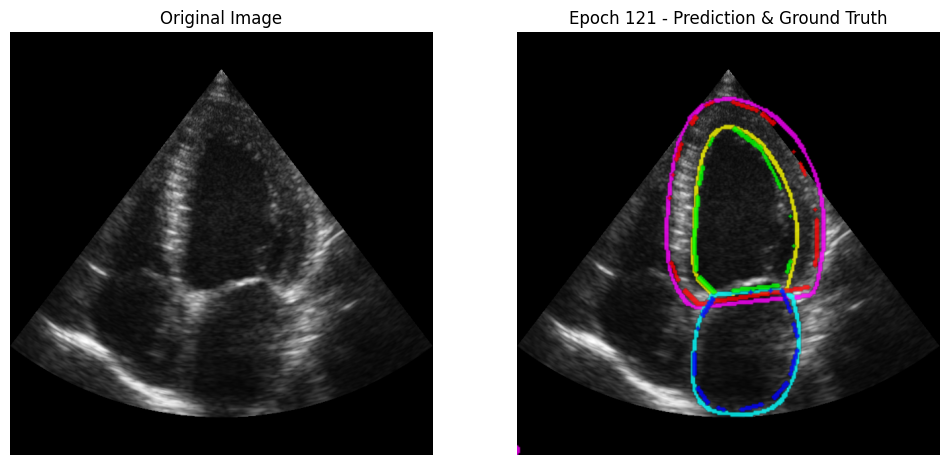

Epoch 122/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]


Train Loss: 0.1101, Train Dice: 0.9765
Val Loss: 0.1502, Val Dice: 0.9286
Epoch 123/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]


Train Loss: 0.1058, Train Dice: 0.9774
Val Loss: 0.1425, Val Dice: 0.9287
Model saved!


<Figure size 640x480 with 0 Axes>

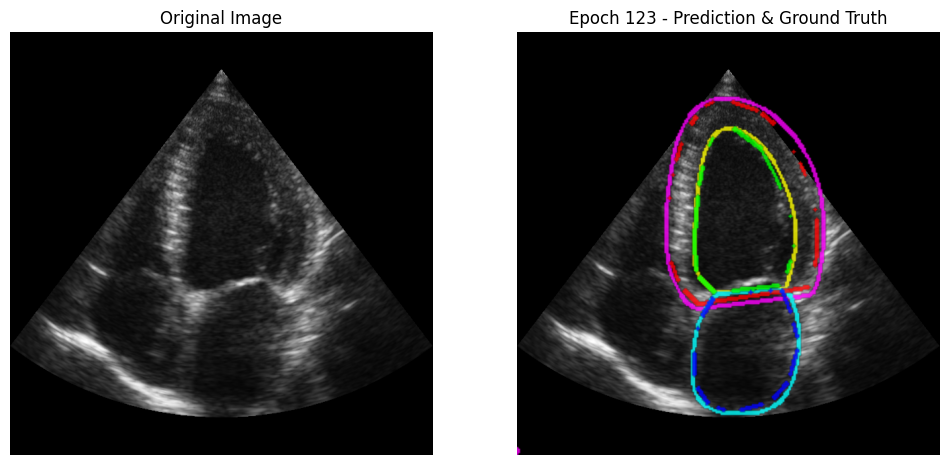

Epoch 124/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.1079, Train Dice: 0.9766
Val Loss: 0.1469, Val Dice: 0.9285
Epoch 125/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Train Loss: 0.1052, Train Dice: 0.9761
Val Loss: 0.1456, Val Dice: 0.9266
Epoch 126/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Train Loss: 0.1043, Train Dice: 0.9770
Val Loss: 0.1470, Val Dice: 0.9270
Epoch 127/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]


Train Loss: 0.1015, Train Dice: 0.9778
Val Loss: 0.1426, Val Dice: 0.9291
Epoch 128/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.1003, Train Dice: 0.9782
Val Loss: 0.1396, Val Dice: 0.9301
Model saved!


<Figure size 640x480 with 0 Axes>

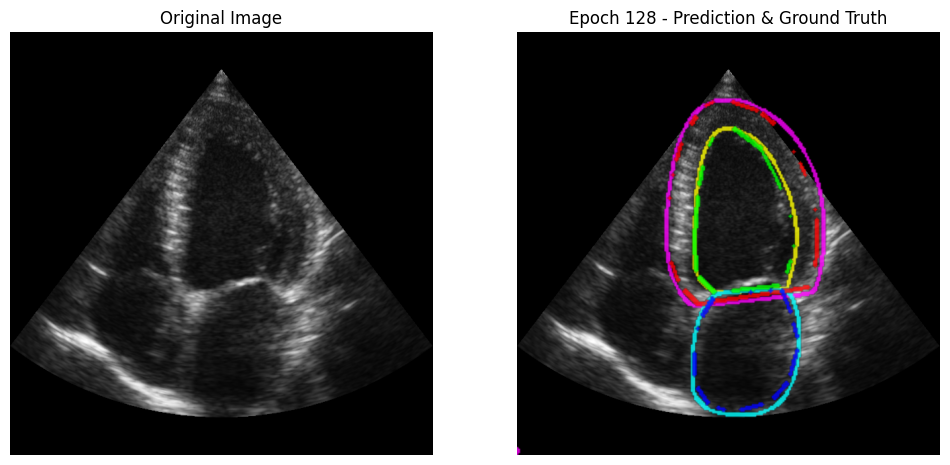

Epoch 129/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.1001, Train Dice: 0.9784
Val Loss: 0.1452, Val Dice: 0.9286
Epoch 130/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Train Loss: 0.0984, Train Dice: 0.9785
Val Loss: 0.1390, Val Dice: 0.9303
Model saved!


<Figure size 640x480 with 0 Axes>

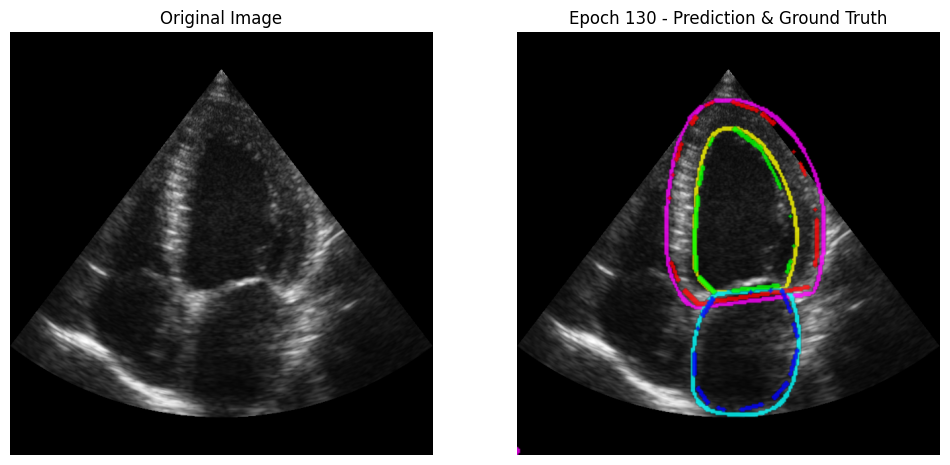

Epoch 131/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.0986, Train Dice: 0.9777
Val Loss: 0.1399, Val Dice: 0.9288
Epoch 132/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]


Train Loss: 0.0962, Train Dice: 0.9786
Val Loss: 0.1396, Val Dice: 0.9280
Epoch 133/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.62s/it]


Train Loss: 0.0941, Train Dice: 0.9785
Val Loss: 0.1355, Val Dice: 0.9271
Model saved!


<Figure size 640x480 with 0 Axes>

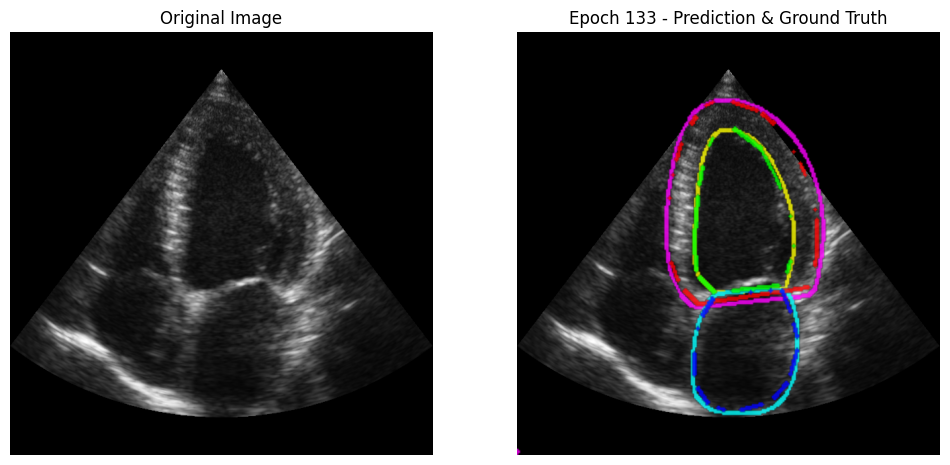

Epoch 134/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0953, Train Dice: 0.9772
Val Loss: 0.1393, Val Dice: 0.9284
Epoch 135/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]


Train Loss: 0.0922, Train Dice: 0.9781
Val Loss: 0.1332, Val Dice: 0.9283
Model saved!


<Figure size 640x480 with 0 Axes>

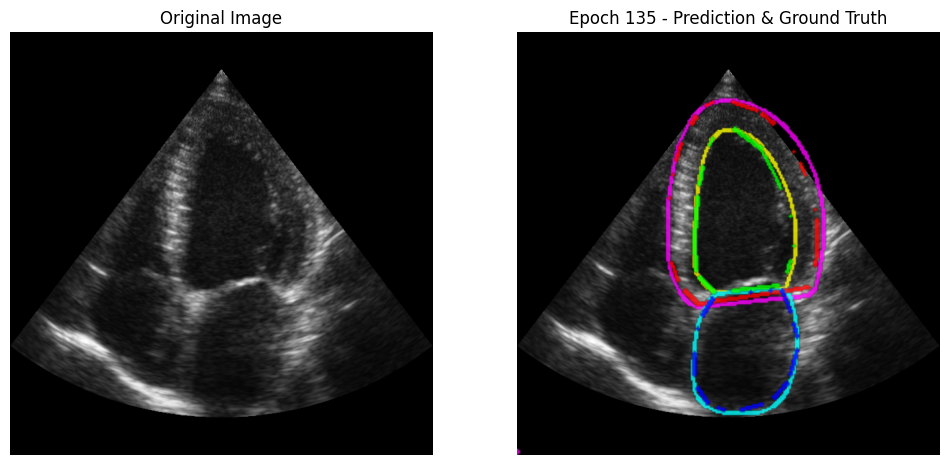

Epoch 136/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Train Loss: 0.0920, Train Dice: 0.9775
Val Loss: 0.1299, Val Dice: 0.9274
Model saved!


<Figure size 640x480 with 0 Axes>

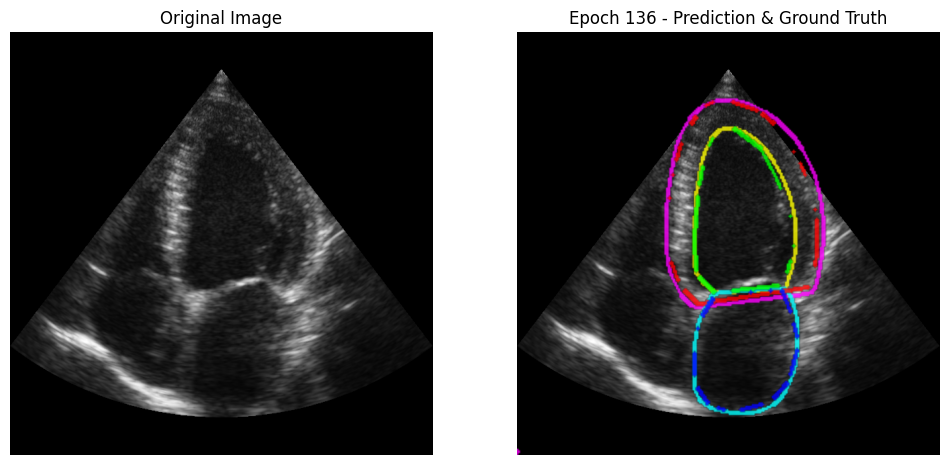

Epoch 137/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


Train Loss: 0.0907, Train Dice: 0.9780
Val Loss: 0.1311, Val Dice: 0.9297
Epoch 138/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0915, Train Dice: 0.9784
Val Loss: 0.1387, Val Dice: 0.9283
Epoch 139/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0875, Train Dice: 0.9793
Val Loss: 0.1264, Val Dice: 0.9300
Model saved!


<Figure size 640x480 with 0 Axes>

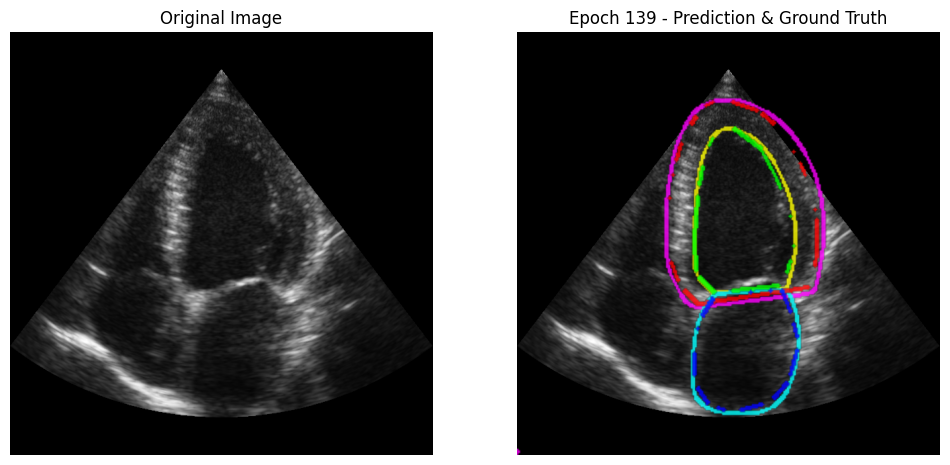

Epoch 140/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.0863, Train Dice: 0.9789
Val Loss: 0.1301, Val Dice: 0.9290
Epoch 141/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]


Train Loss: 0.0869, Train Dice: 0.9786
Val Loss: 0.1303, Val Dice: 0.9280
Epoch 142/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0852, Train Dice: 0.9798
Val Loss: 0.1271, Val Dice: 0.9297
Epoch 143/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.46s/it]


Train Loss: 0.0847, Train Dice: 0.9794
Val Loss: 0.1297, Val Dice: 0.9280
Epoch 144/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.0840, Train Dice: 0.9792
Val Loss: 0.1269, Val Dice: 0.9291
Epoch 145/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]


Train Loss: 0.0812, Train Dice: 0.9796
Val Loss: 0.1239, Val Dice: 0.9298
Model saved!


<Figure size 640x480 with 0 Axes>

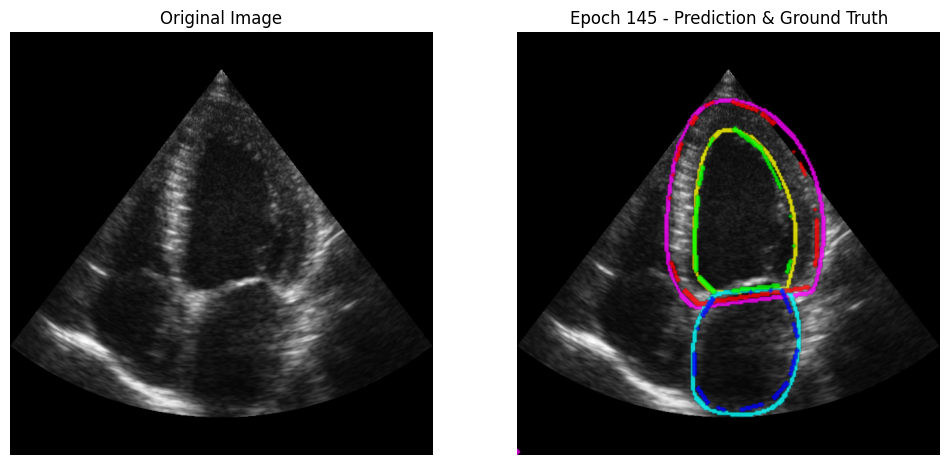

Epoch 146/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]


Train Loss: 0.0809, Train Dice: 0.9800
Val Loss: 0.1290, Val Dice: 0.9295
Epoch 147/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Train Loss: 0.0798, Train Dice: 0.9804
Val Loss: 0.1243, Val Dice: 0.9293
Epoch 148/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]


Train Loss: 0.0790, Train Dice: 0.9795
Val Loss: 0.1229, Val Dice: 0.9283
Model saved!


<Figure size 640x480 with 0 Axes>

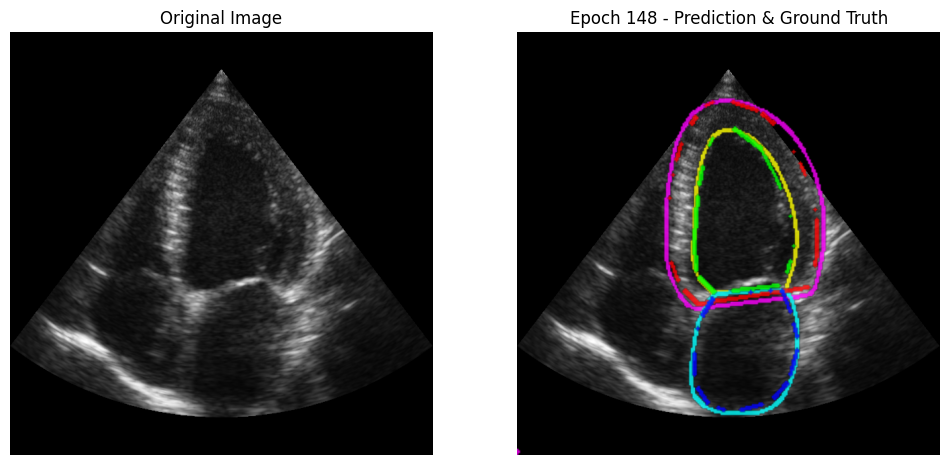

Epoch 149/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]


Train Loss: 0.0794, Train Dice: 0.9802
Val Loss: 0.1244, Val Dice: 0.9294
Epoch 150/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0780, Train Dice: 0.9804
Val Loss: 0.1245, Val Dice: 0.9263
Epoch 151/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]


Train Loss: 0.0785, Train Dice: 0.9799
Val Loss: 0.1229, Val Dice: 0.9280
Model saved!


<Figure size 640x480 with 0 Axes>

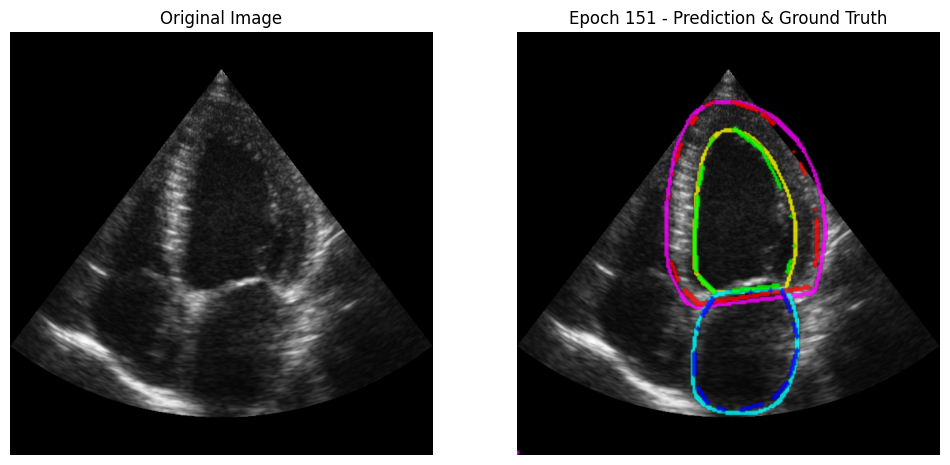

Epoch 152/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]


Train Loss: 0.0759, Train Dice: 0.9810
Val Loss: 0.1198, Val Dice: 0.9285
Model saved!


<Figure size 640x480 with 0 Axes>

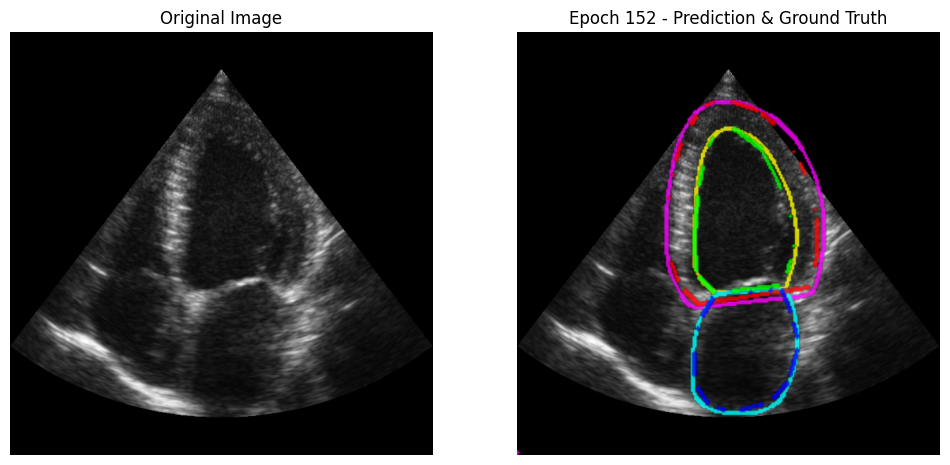

Epoch 153/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0732, Train Dice: 0.9818
Val Loss: 0.1168, Val Dice: 0.9307
Model saved!


<Figure size 640x480 with 0 Axes>

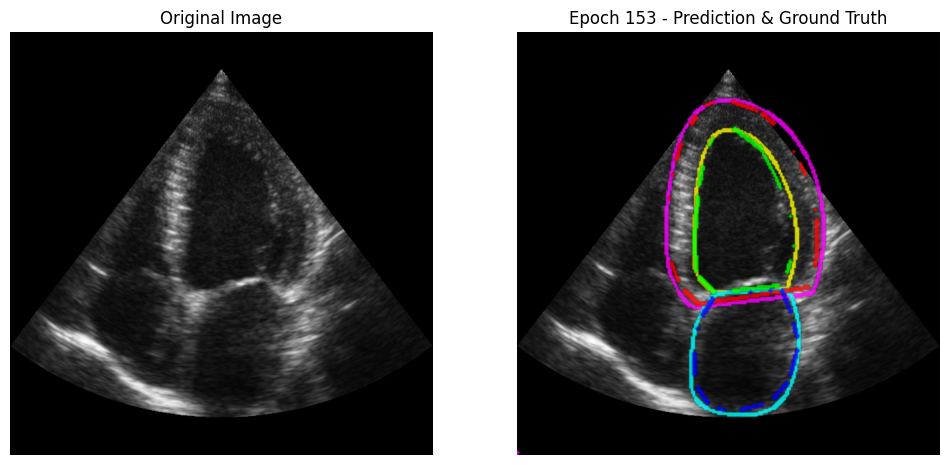

Epoch 154/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0744, Train Dice: 0.9812
Val Loss: 0.1220, Val Dice: 0.9278
Epoch 155/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]


Train Loss: 0.0743, Train Dice: 0.9806
Val Loss: 0.1183, Val Dice: 0.9283
Epoch 156/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0735, Train Dice: 0.9809
Val Loss: 0.1176, Val Dice: 0.9292
Epoch 157/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]


Train Loss: 0.0744, Train Dice: 0.9801
Val Loss: 0.1179, Val Dice: 0.9301
Epoch 158/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0733, Train Dice: 0.9800
Val Loss: 0.1208, Val Dice: 0.9287
Epoch 159/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Train Loss: 0.0708, Train Dice: 0.9803
Val Loss: 0.1169, Val Dice: 0.9293
Epoch 160/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]


Train Loss: 0.0714, Train Dice: 0.9808
Val Loss: 0.1175, Val Dice: 0.9291
Epoch 161/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.0714, Train Dice: 0.9801
Val Loss: 0.1153, Val Dice: 0.9301
Model saved!


<Figure size 640x480 with 0 Axes>

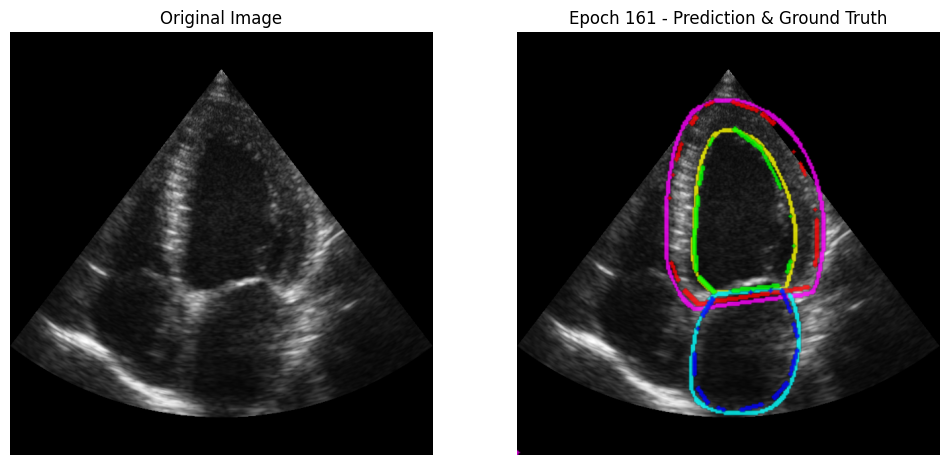

Epoch 162/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]


Train Loss: 0.0688, Train Dice: 0.9810
Val Loss: 0.1140, Val Dice: 0.9308
Model saved!


<Figure size 640x480 with 0 Axes>

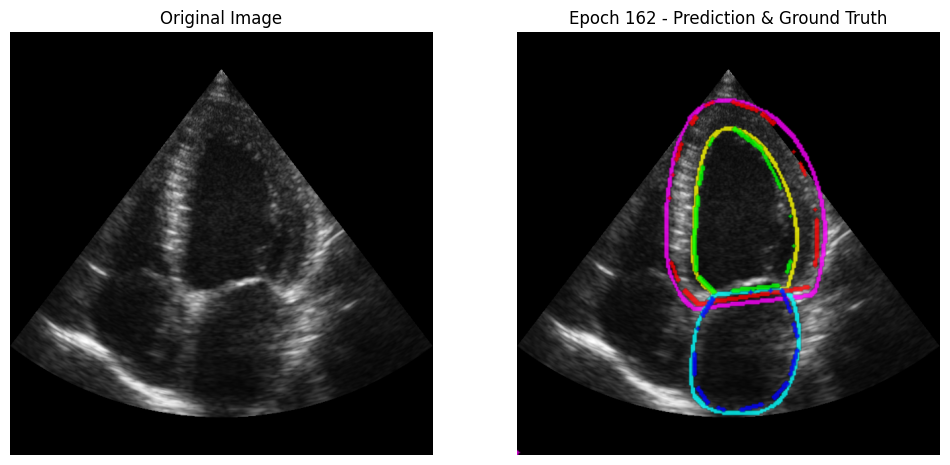

Epoch 163/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.62s/it]


Train Loss: 0.0713, Train Dice: 0.9806
Val Loss: 0.1167, Val Dice: 0.9296
Epoch 164/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]


Train Loss: 0.0680, Train Dice: 0.9817
Val Loss: 0.1146, Val Dice: 0.9290
Epoch 165/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Train Loss: 0.0656, Train Dice: 0.9821
Val Loss: 0.1117, Val Dice: 0.9293
Model saved!


<Figure size 640x480 with 0 Axes>

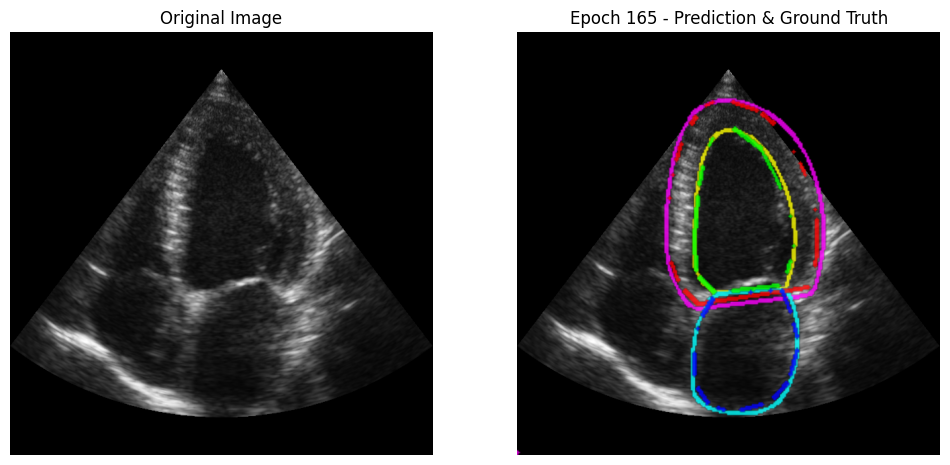

Epoch 166/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]


Train Loss: 0.0663, Train Dice: 0.9819
Val Loss: 0.1133, Val Dice: 0.9293
Epoch 167/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0666, Train Dice: 0.9819
Val Loss: 0.1138, Val Dice: 0.9295
Epoch 168/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]


Train Loss: 0.0648, Train Dice: 0.9818
Val Loss: 0.1108, Val Dice: 0.9290
Model saved!


<Figure size 640x480 with 0 Axes>

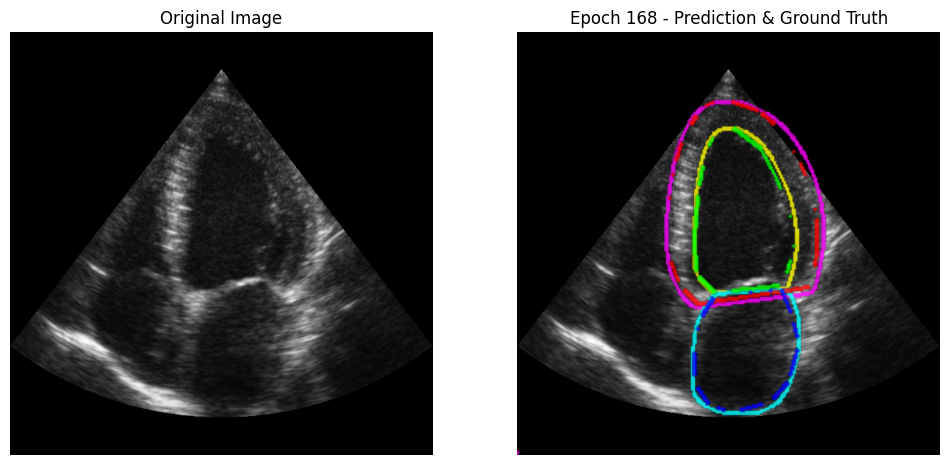

Epoch 169/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]


Train Loss: 0.0652, Train Dice: 0.9816
Val Loss: 0.1138, Val Dice: 0.9292
Epoch 170/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]


Train Loss: 0.0657, Train Dice: 0.9814
Val Loss: 0.1132, Val Dice: 0.9276
Epoch 171/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]


Train Loss: 0.0654, Train Dice: 0.9815
Val Loss: 0.1131, Val Dice: 0.9293
Epoch 172/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.0647, Train Dice: 0.9814
Val Loss: 0.1104, Val Dice: 0.9295
Model saved!


<Figure size 640x480 with 0 Axes>

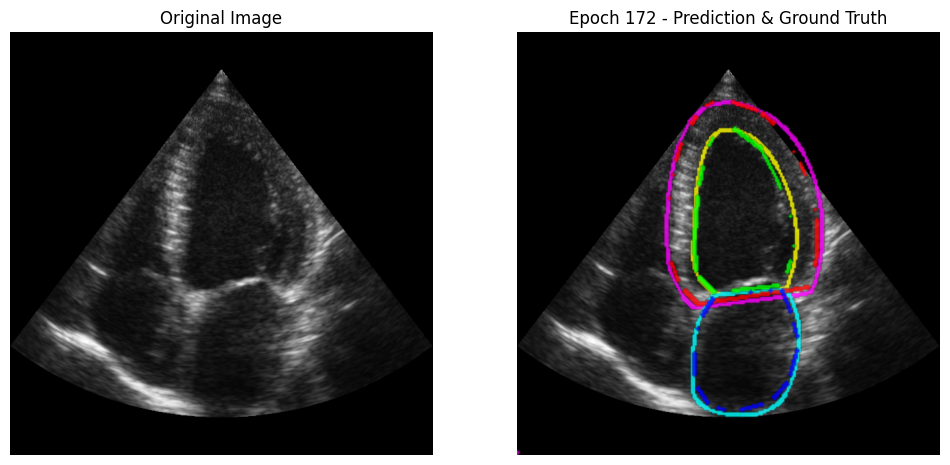

Epoch 173/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.0624, Train Dice: 0.9822
Val Loss: 0.1107, Val Dice: 0.9300
Epoch 174/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.62s/it]


Train Loss: 0.0636, Train Dice: 0.9819
Val Loss: 0.1107, Val Dice: 0.9300
Epoch 175/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]


Train Loss: 0.0611, Train Dice: 0.9822
Val Loss: 0.1093, Val Dice: 0.9297
Model saved!


<Figure size 640x480 with 0 Axes>

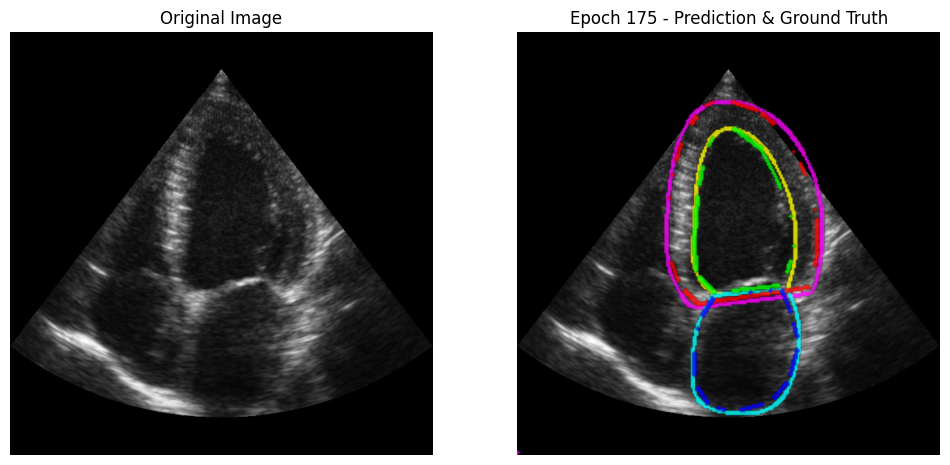

Epoch 176/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]


Train Loss: 0.0603, Train Dice: 0.9824
Val Loss: 0.1082, Val Dice: 0.9301
Model saved!


<Figure size 640x480 with 0 Axes>

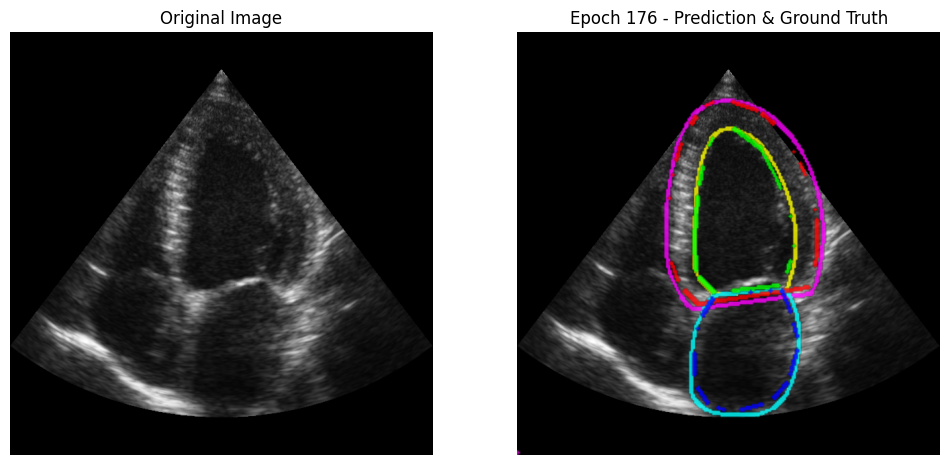

Epoch 177/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]


Train Loss: 0.0617, Train Dice: 0.9811
Val Loss: 0.1085, Val Dice: 0.9299
Epoch 178/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.46s/it]


Train Loss: 0.0611, Train Dice: 0.9827
Val Loss: 0.1097, Val Dice: 0.9299
Epoch 179/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.0607, Train Dice: 0.9825
Val Loss: 0.1085, Val Dice: 0.9294
Epoch 180/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]


Train Loss: 0.0591, Train Dice: 0.9826
Val Loss: 0.1074, Val Dice: 0.9297
Model saved!


<Figure size 640x480 with 0 Axes>

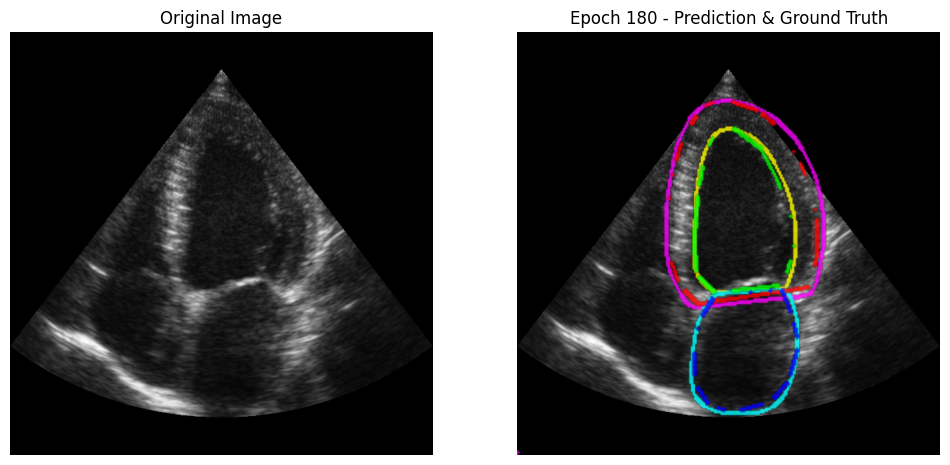

Epoch 181/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0592, Train Dice: 0.9817
Val Loss: 0.1086, Val Dice: 0.9283
Epoch 182/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0584, Train Dice: 0.9819
Val Loss: 0.1051, Val Dice: 0.9306
Model saved!


<Figure size 640x480 with 0 Axes>

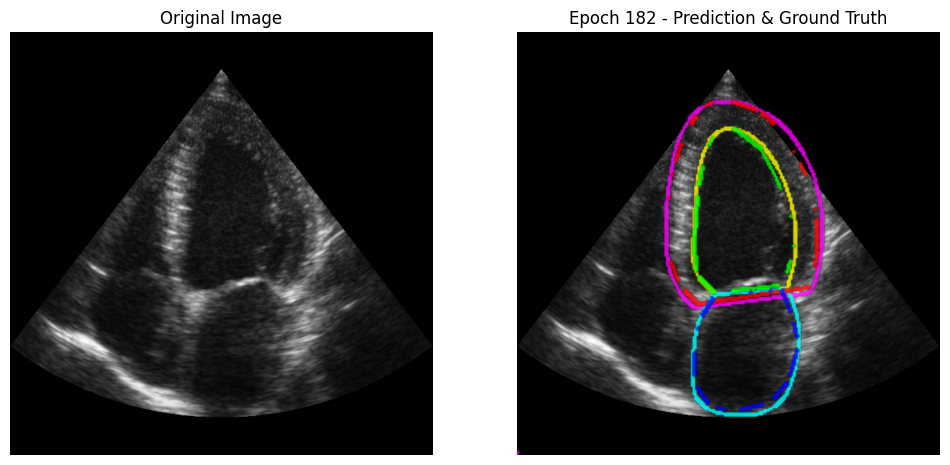

Epoch 183/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]


Train Loss: 0.0576, Train Dice: 0.9827
Val Loss: 0.1065, Val Dice: 0.9295
Epoch 184/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]


Train Loss: 0.0572, Train Dice: 0.9826
Val Loss: 0.1040, Val Dice: 0.9311
Model saved!


<Figure size 640x480 with 0 Axes>

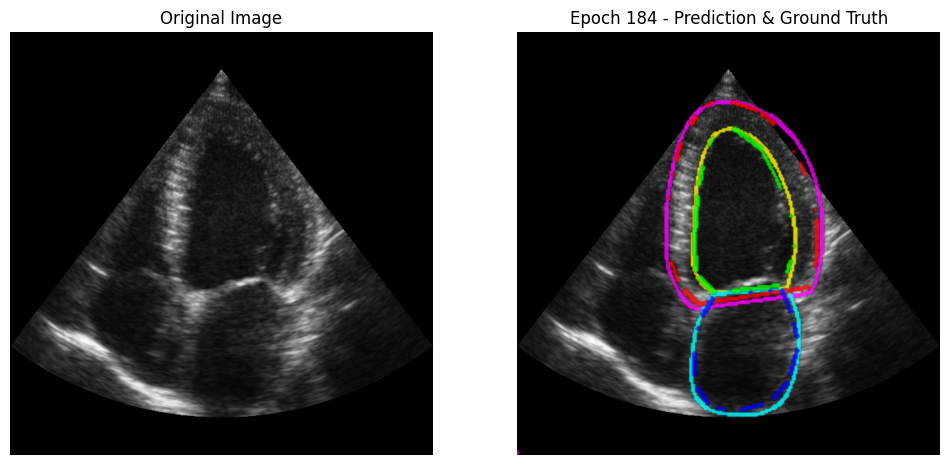

Epoch 185/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.0569, Train Dice: 0.9826
Val Loss: 0.1057, Val Dice: 0.9297
Epoch 186/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]


Train Loss: 0.0565, Train Dice: 0.9822
Val Loss: 0.1052, Val Dice: 0.9299
Epoch 187/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.0563, Train Dice: 0.9828
Val Loss: 0.1055, Val Dice: 0.9295
Epoch 188/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]


Train Loss: 0.0554, Train Dice: 0.9831
Val Loss: 0.1044, Val Dice: 0.9295
Epoch 189/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]


Train Loss: 0.0538, Train Dice: 0.9830
Val Loss: 0.1034, Val Dice: 0.9299
Model saved!


<Figure size 640x480 with 0 Axes>

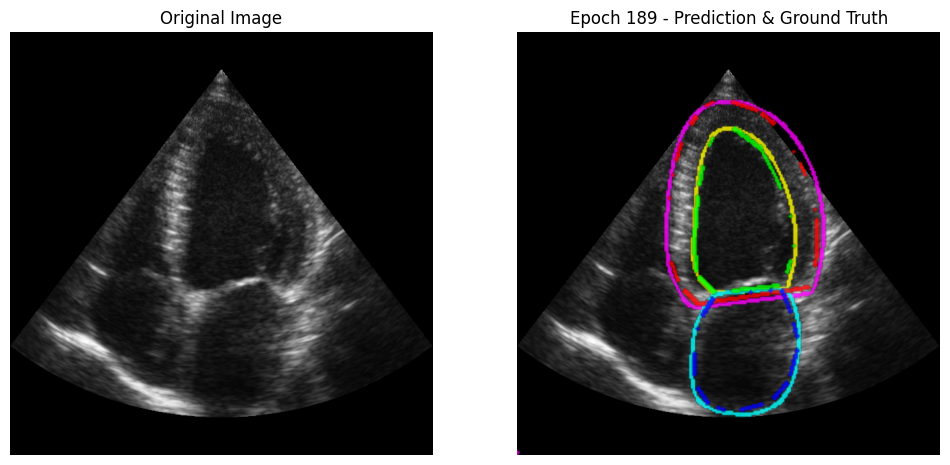

Epoch 190/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]


Train Loss: 0.0547, Train Dice: 0.9837
Val Loss: 0.1033, Val Dice: 0.9306
Model saved!


<Figure size 640x480 with 0 Axes>

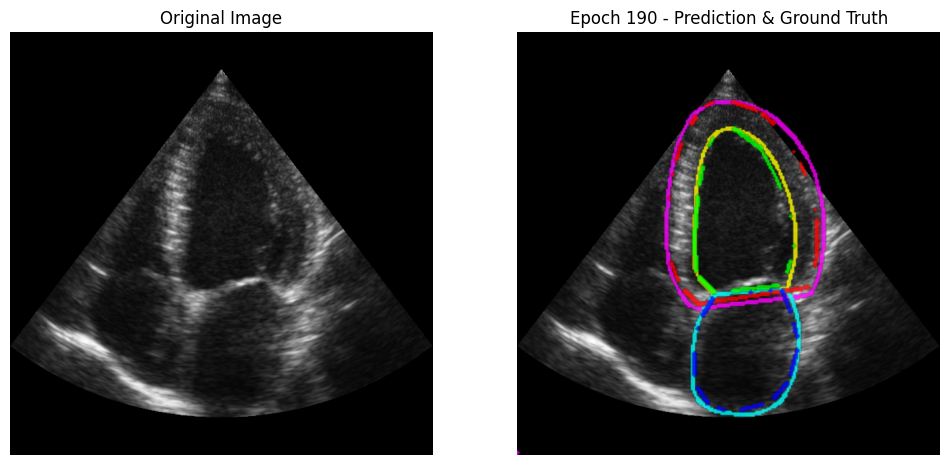

Epoch 191/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.0551, Train Dice: 0.9828
Val Loss: 0.1033, Val Dice: 0.9302
Epoch 192/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


Train Loss: 0.0540, Train Dice: 0.9831
Val Loss: 0.1033, Val Dice: 0.9303
Epoch 193/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]


Train Loss: 0.0532, Train Dice: 0.9832
Val Loss: 0.1033, Val Dice: 0.9297
Epoch 194/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.74s/it]


Train Loss: 0.0532, Train Dice: 0.9830
Val Loss: 0.1036, Val Dice: 0.9293
Epoch 195/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.0531, Train Dice: 0.9831
Val Loss: 0.1025, Val Dice: 0.9291
Model saved!


<Figure size 640x480 with 0 Axes>

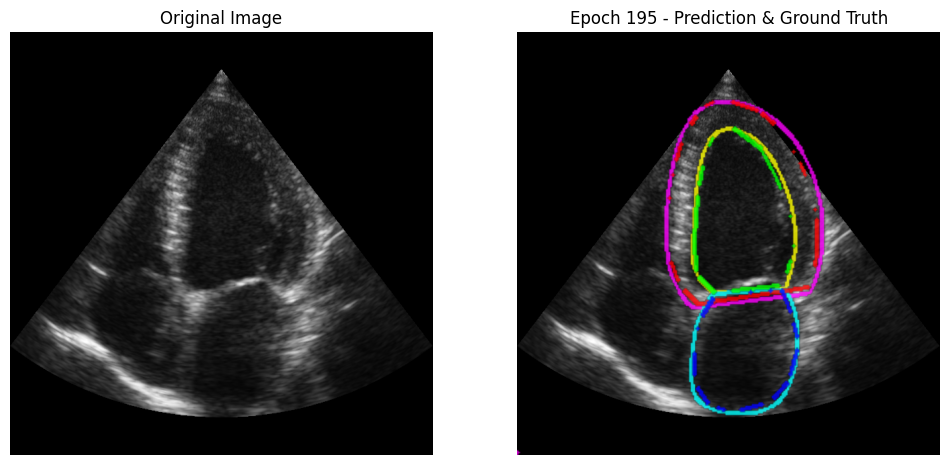

Epoch 196/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]


Train Loss: 0.0540, Train Dice: 0.9821
Val Loss: 0.1020, Val Dice: 0.9298
Model saved!


<Figure size 640x480 with 0 Axes>

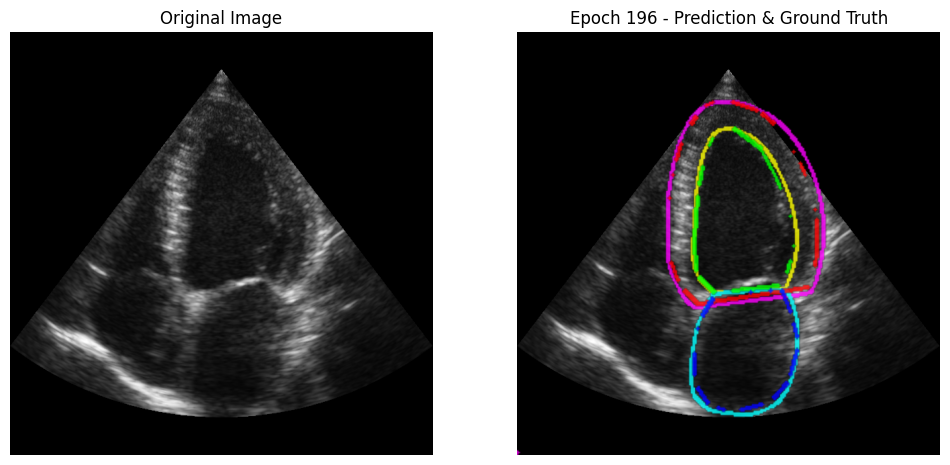

Epoch 197/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]


Train Loss: 0.0510, Train Dice: 0.9831
Val Loss: 0.1004, Val Dice: 0.9301
Model saved!


<Figure size 640x480 with 0 Axes>

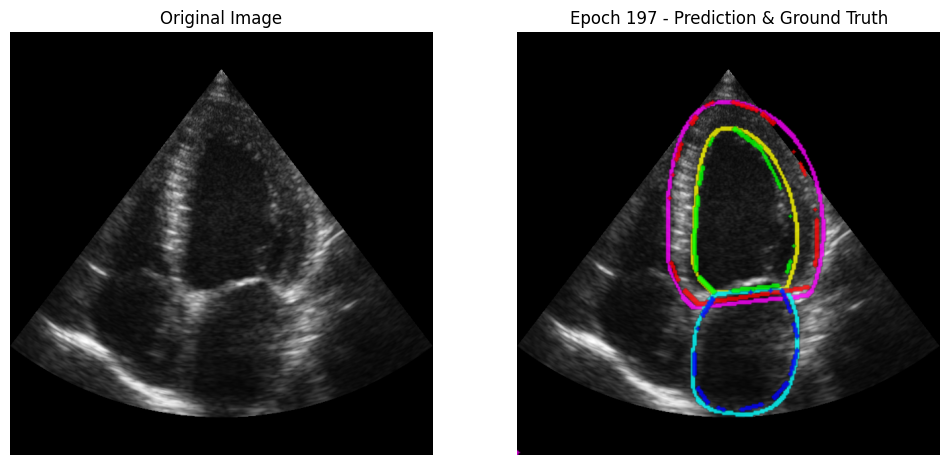

Epoch 198/200


Validation: 100%|██████████| 2/2 [00:03<00:00,  1.66s/it]


Train Loss: 0.0494, Train Dice: 0.9833
Val Loss: 0.1017, Val Dice: 0.9288
Epoch 199/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


Train Loss: 0.0467, Train Dice: 0.9832
Val Loss: 0.0957, Val Dice: 0.9301
Model saved!


<Figure size 640x480 with 0 Axes>

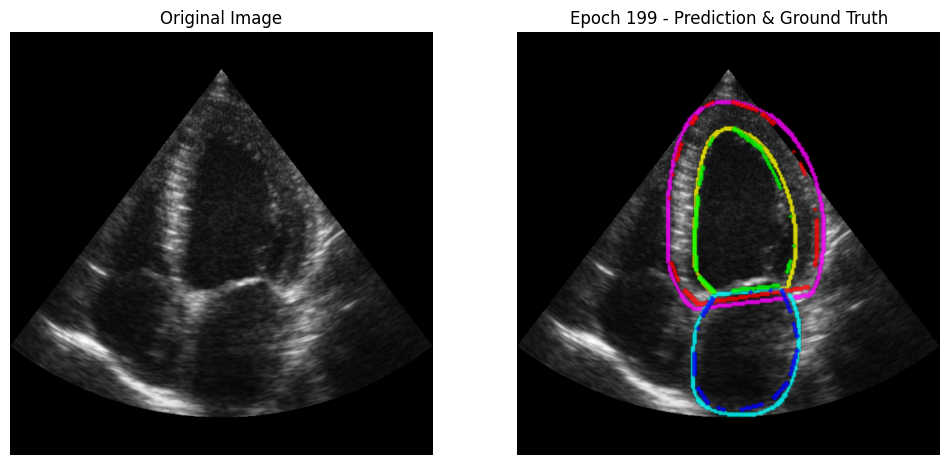

Epoch 200/200


Validation: 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]


Train Loss: 0.0456, Train Dice: 0.9840
Val Loss: 0.0988, Val Dice: 0.9298
Video saved as predictions_only_video.avi with 82 frames


<Figure size 640x480 with 0 Axes>

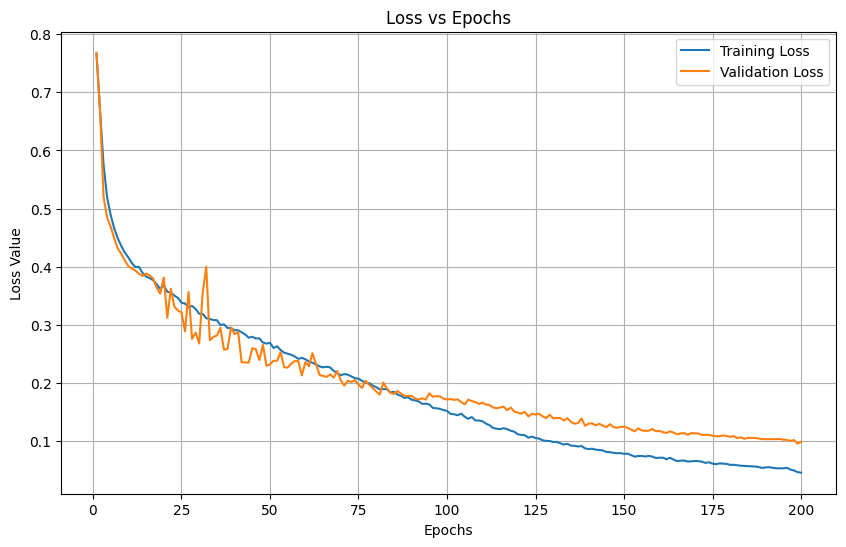

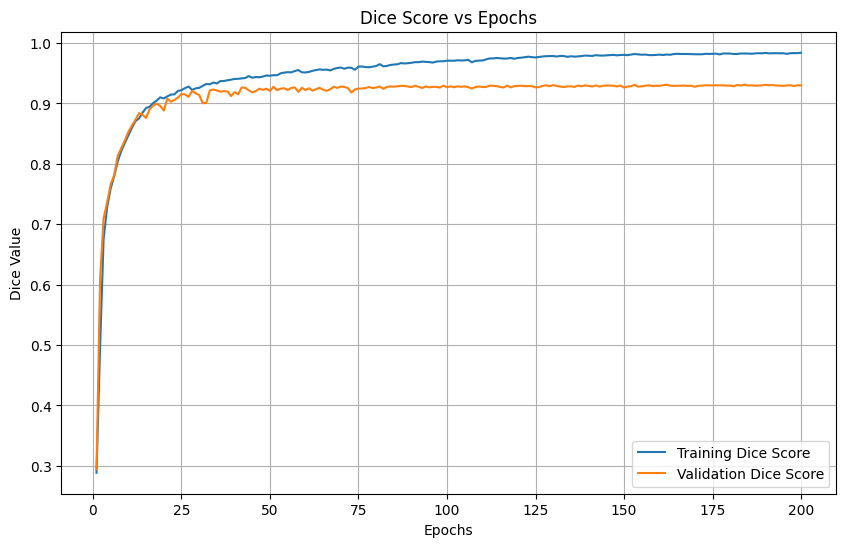

In [18]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import torch

# Lists to store metrics
train_losses = []
val_losses = []
train_dices = []
val_dices = []
best_val_loss = float('inf')
patience = 0
prediction_frames = []

# Color schemes
pred_colors = {
    1: (0, 255, 255),  # yellow
    2: (255, 0, 255),  # magenta
    3: (255, 255, 0)   # cyan
}

gt_colors = {
    1: (0, 255, 0),    # green
    2: (0, 0, 255),    # blue
    3: (255, 0, 0)     # red
}

def create_solid_contours(mask, class_colors, thickness=2, alpha=0.8):
    """Create solid contours for predictions."""
    mask_solid = np.zeros((*mask.shape, 4), dtype=np.uint8)

    for c, color in class_colors.items():
        binary_mask = (mask == c).astype(np.uint8)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        convex_contours = [cv2.convexHull(cnt) for cnt in contours]
        cv2.drawContours(mask_solid, convex_contours, -1, (*color, int(255 * alpha)), thickness=thickness)

    return mask_solid

def create_hashed_overlay(mask, class_colors, thickness=2, dash_length=2, gap_length=7, alpha=0.8):
    """Creates a uniform hashed pattern overlay with consistent spacing."""
    mask_hashed = np.zeros((*mask.shape, 4), dtype=np.uint8)

    for c, color in class_colors.items():
        binary_mask = (mask == c).astype(np.uint8)
        kernel = np.ones((3,3), np.uint8)
        eroded_mask = cv2.erode(binary_mask, kernel, iterations=1)
        contours, _ = cv2.findContours(eroded_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        convex_contours = [cv2.convexHull(cnt) for cnt in contours]

        for cnt in convex_contours:
            perimeter = cv2.arcLength(cnt, True)
            num_points = int(perimeter / (dash_length + gap_length))
            if num_points < 2:
                continue

            resampled_points = []
            for i in range(num_points):
                dist = (i * perimeter) / num_points
                point = cv2.arcLength(cnt[:int((i/num_points)*len(cnt))], False)
                idx = 0
                curr_dist = 0
                while curr_dist < dist and idx < len(cnt)-1:
                    curr_dist += np.linalg.norm(cnt[idx+1][0] - cnt[idx][0])
                    idx += 1
                resampled_points.append(cnt[idx][0])

            for i in range(0, len(resampled_points)-1, 2):
                pt1 = tuple(resampled_points[i])
                pt2 = tuple(resampled_points[i+1])
                cv2.line(mask_hashed, pt1, pt2, (*color, int(255 * alpha)), thickness)

    return mask_hashed

def plot_metrics(train_metric, val_metric, metric_name, ylabel):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(train_metric) + 1), train_metric, label=f'Training {metric_name}')
    plt.plot(range(1, len(val_metric) + 1), val_metric, label=f'Validation {metric_name}')
    plt.xlabel('Epochs')
    plt.ylabel(ylabel)
    plt.title(f'{metric_name} vs Epochs')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'{metric_name.lower()}_plot.png')
    plt.show()
    plt.close()

def visualize_prediction_and_show(model, dataset, idx, epoch, device):
    model.eval()
    original_image_path = os.path.join(test_images_path, test_dataset.images[idx])
    original_image = cv2.imread(original_image_path)
    image, mask, _ = dataset[idx]

    # Get prediction
    image_batch = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_batch)
        pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

    # Create overlays
    pred_solid = create_solid_contours(pred, pred_colors)
    gt_hashed = create_hashed_overlay(mask.cpu().numpy(), gt_colors)

    # Resize overlays to match original image
    pred_solid = cv2.resize(pred_solid, (original_image.shape[1], original_image.shape[0]))
    gt_hashed = cv2.resize(gt_hashed, (original_image.shape[1], original_image.shape[0]))

    # Convert original image to RGBA
    result = cv2.cvtColor(original_image, cv2.COLOR_BGR2BGRA)

    # 1. Apply the solid prediction contours FIRST
    alpha_pred = pred_solid[:, :, 3:4].astype(float) / 255
    result = (pred_solid[:, :, :3] * alpha_pred + result[:, :, :3] * (1 - alpha_pred)).astype(np.uint8)

    # 2. Apply the hashed ground truth contours SECOND (on top)
    alpha_gt = gt_hashed[:, :, 3:4].astype(float) / 255
    result = (gt_hashed[:, :, :3] * alpha_gt + result[:, :, :3] * (1 - alpha_gt)).astype(np.uint8)

    # Display the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f"Epoch {epoch+1} - Prediction & Ground Truth")
    plt.axis('off')

    plt.show(block=False)
    plt.pause(0.1)
    plt.clf()

    # Convert to BGR for saving frames
    result_bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)

    # Add epoch text overlay
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = f'Epoch: {epoch+1}'
    text_size = cv2.getTextSize(text, font, 1, 2)[0]
    text_x = 10
    text_y = 30

    cv2.rectangle(result_bgr,
                 (text_x - 5, text_y - text_size[1] - 5),
                 (text_x + text_size[0] + 5, text_y + 5),
                 (255, 255, 255),
                 -1)

    cv2.putText(result_bgr,
                text,
                (text_x, text_y),
                font,
                1,
                (0, 0, 0),
                2,
                cv2.LINE_AA)

    prediction_frames.append(result_bgr)

# Define test image index
test_image_idx = 21  # Ensure it's set before use

# Training loop
for epoch in range(NBEPOCHS):
    print(f"Epoch {epoch+1}/{NBEPOCHS}")

    train_loss, train_iou = train(model, train_loader, optimizer, criterion, device)
    val_loss, val_iou = validate(model, valid_loader, criterion, device)

    train_dice = 2 * train_iou / (1 + train_iou)
    val_dice = 2 * val_iou / (1 + val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_dices.append(train_dice)
    val_dices.append(val_dice)

    print(f"Train Loss: {train_loss:.4f}, Train Dice: {train_dice:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Dice: {val_dice:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience = 0
        torch.save(model.state_dict(), os.path.join(model_path, "best_model.pth"))
        print("Model saved!")

        model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth")))
        visualize_prediction_and_show(model, test_dataset, test_image_idx, epoch, device)  # Ensure index is used correctly
    else:
        patience += 1
        if patience >= NBPATIENCE_EPOCHS:
            print("Early stopping triggered!")
            break

# Create video after training
if prediction_frames:
    # Get dimensions from the first frame
    height, width = prediction_frames[0].shape[:2]
    video_filename = "predictions_only_video.avi"
    video_writer = cv2.VideoWriter(video_filename,
                                 cv2.VideoWriter_fourcc(*'XVID'),
                                 2,  # fps
                                 (width, height),
                                 isColor=True)

    # Write all stored frames to video
    for frame in prediction_frames:
        video_writer.write(frame)

    video_writer.release()
    print(f"Video saved as {video_filename} with {len(prediction_frames)} frames")

# Plot final metrics
plot_metrics(train_losses, val_losses, 'Loss', 'Loss Value')
plot_metrics(train_dices, val_dices, 'Dice Score', 'Dice Value')

# Separate datasets for ED and ES frames


In [19]:
# Separate datasets for ED and ES frames
ed_images = []
es_images = []

# Filter test dataset based on image name
for image, mask, filename in test_dataset:
    # print("Image name: ", filename)
    if filename.endswith("ED.png"):
        # print("Image name ED: ", filename)
        ed_images.append((image, mask))
    elif filename.endswith("ES.png"):
        # print("Image name ES: ", filename)
        es_images.append((image, mask))

# Create DataLoaders for ED and ES frames
ed_loader = DataLoader(ed_images, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
es_loader = DataLoader(es_images, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# Evaluation


## Built-in functions

### Test on the whole images

In [20]:
import torch
import numpy as np
from torchmetrics import Dice, JaccardIndex, F1Score
from medpy.metric.binary import hd, assd
from sklearn.metrics import f1_score
from monai.metrics import HausdorffDistanceMetric, SurfaceDistanceMetric

# Number of classes (excluding background class)
NUM_CLASSES = 4  # Assuming classes 1, 2, 3, ..., NUM_CLASSES - 1 are non-background classes
BACKGROUND_CLASS = 0  # Background class index

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

# Function to compute IoU (Intersection over Union)
def compute_iou(pred, target):
    intersection = (pred * target).sum()
    union = (pred + target).clip(0, 1).sum()
    iou = intersection / (union + 1e-6)
    return iou

# Initialize metrics with ignore_index to exclude the background class
dice_metric = Dice(average="macro", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
iou_metric = JaccardIndex(task="multiclass", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
f1_metric = F1Score(task="multiclass", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95)
assd_metric = SurfaceDistanceMetric(include_background=False)

# Metric Containers
dice_scores = []
iou_scores = []
f1_scores = []
hd_scores = []
assd_scores = []

# Per-class metric
per_class_dice_scores = [[] for _ in range(NUM_CLASSES)]
per_class_iou_scores = [[] for _ in range(NUM_CLASSES)]
per_class_hd_scores = [[] for _ in range(NUM_CLASSES)]
per_class_assd_scores = [[] for _ in range(NUM_CLASSES)]
per_class_f1_scores = [[] for _ in range(NUM_CLASSES)]

# Test loss
num_batches = 0
test_loss = 0

with torch.no_grad():
    for images, masks, _ in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)

        loss = criterion(outputs, masks)
        test_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        # Compute overall metrics
        dice_value = dice_metric(preds, masks)
        iou_value = iou_metric(preds, masks)
        f1_value = f1_metric(preds, masks)

        dice_scores.append(dice_value.item())
        iou_scores.append(iou_value.item())
        f1_scores.append(f1_value.item())

        # Compute per-class metrics excluding background
        for cls in range(1, NUM_CLASSES):
            # Extract binary masks for the current class
            preds_cls = (preds == cls).int()
            masks_cls = (masks == cls).int()

            # Compute Dice score for the current class
            dice_score_cls = dice_metric(preds_cls, masks_cls)
            iou_score_cls = compute_iou(preds_cls.float().cpu().numpy(), masks_cls.float().cpu().numpy())

            per_class_dice_scores[cls].append(dice_score_cls.item())
            per_class_iou_scores[cls].append(iou_score_cls.item())

            preds_cls_np = preds_cls.cpu().numpy()
            masks_cls_np = masks_cls.cpu().numpy()

            # Compute F1 score using scikit-learn
            preds_flat = preds_cls_np.flatten()
            masks_flat = masks_cls_np.flatten()
            f1 = f1_score(masks_flat, preds_flat, average="binary", zero_division=0)
            per_class_f1_scores[cls].append(f1)

            # Compute HD and ASSD (requires numpy arrays)
            for p, m in zip(preds_cls_np, masks_cls_np):
                if p.any() and m.any():  # Avoid computation if no foreground in either
                    per_class_hd_scores[cls].append(hd(p, m))
                    per_class_assd_scores[cls].append(assd(p, m))

        # Compute HD and ASSD metrics for the whole batch
        pred_tensor = preds.unsqueeze(1).float()  # Shape: [batch, 1, H, W]
        masks_tensor = masks.unsqueeze(1).float()  # Shape: [batch, 1, H, W]

        hd_metric(y_pred=pred_tensor, y=masks_tensor)
        assd_metric(y_pred=pred_tensor, y=masks_tensor)

        hd_scores.append(hd_metric.aggregate().item())
        assd_scores.append(assd_metric.aggregate().item())

        # Reset MONAI metrics after each batch
        hd_metric.reset()
        assd_metric.reset()

        num_batches += 1

# Compute loss
test_loss /= num_batches

# Compute Overall Averages
overall_dice = sum(dice_scores) / len(dice_scores)
overall_iou = sum(iou_scores) / len(iou_scores)
overall_f1 = sum(f1_scores) / len(f1_scores)
overall_hd = sum(hd_scores) / len(hd_scores)
overall_assd = sum(assd_scores) / len(assd_scores)


print("\nTest Results:")
print(f"Test Loss: {test_loss:.4f}\n")

# Define class names
class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

# Prepare results for overall evaluation and per-class evaluation
overall_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
]

per_class_results = []
for c in range(1, NUM_CLASSES):  # Exclude background class
    per_class_results.append([
        class_names[c-1],  # Use class names
        f"{np.mean(per_class_dice_scores[c]):.3f}",
        f"{np.nanmean(per_class_iou_scores[c]):.3f}",
        f"{np.mean(per_class_assd_scores[c]):.2f}",
        f"{np.mean(per_class_hd_scores[c]):.1f}",
        f"{np.mean(per_class_f1_scores[c]):.3f}"
    ])

# Combine overall and per-class results into one table
combined_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
] + per_class_results

# Table headers
headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

# Print the combined table with specific formats for each column
print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

<ipython-input-20-60cc5f6f8ff8>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=d


Test Results:
Test Loss: 0.0847

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.925 | 0.895 |   1.73 |         4.7 |      0.928 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.950 | 0.904 |   1.68 |         5.5 |      0.950 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.892 | 0.806 |   1.74 |         6.1 |      0.892 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.933 | 0.875 |   1.86 |         5.8 |      0.933 |
+----------------+--------+-------+--------+-------------+------------+


### Test on ED & ES images separatly

In [21]:
import torch
import numpy as np
from torchmetrics import Dice, JaccardIndex, F1Score
from medpy.metric.binary import hd, assd
from sklearn.metrics import f1_score
from monai.metrics import HausdorffDistanceMetric, SurfaceDistanceMetric

# Number of classes (excluding background class)
NUM_CLASSES = 4  # Assuming classes 1, 2, 3, ..., NUM_CLASSES - 1 are non-background classes
BACKGROUND_CLASS = 0  # Background class index

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

# Function to compute IoU (Intersection over Union)
def compute_iou(pred, target):
    intersection = (pred * target).sum()
    union = (pred + target).clip(0, 1).sum()
    iou = intersection / (union + 1e-6)
    return iou

def evaluate(loader, loader_name):
    print(f"Evaluating {loader_name} frames...\n")

    # Initialize metrics with ignore_index to exclude the background class
    dice_metric = Dice(average="macro", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
    iou_metric = JaccardIndex(task="multiclass", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
    f1_metric = F1Score(task="multiclass", num_classes=NUM_CLASSES, ignore_index=BACKGROUND_CLASS).to(device)
    hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95)
    assd_metric = SurfaceDistanceMetric(include_background=False)

    # Metric Containers
    dice_scores = []
    iou_scores = []
    f1_scores = []
    hd_scores = []
    assd_scores = []

    # Per-class metric
    per_class_dice_scores = [[] for _ in range(NUM_CLASSES)]
    per_class_iou_scores = [[] for _ in range(NUM_CLASSES)]
    per_class_hd_scores = [[] for _ in range(NUM_CLASSES)]
    per_class_assd_scores = [[] for _ in range(NUM_CLASSES)]
    per_class_f1_scores = [[] for _ in range(NUM_CLASSES)]

    # Test loss
    num_batches = 0
    test_loss = 0

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)

            loss = criterion(outputs, masks)
            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            # Compute overall metrics
            dice_value = dice_metric(preds, masks)
            iou_value = iou_metric(preds, masks)
            f1_value = f1_metric(preds, masks)

            dice_scores.append(dice_value.item())
            iou_scores.append(iou_value.item())
            f1_scores.append(f1_value.item())

            # Compute per-class metrics excluding background
            for cls in range(1, NUM_CLASSES):
                # Extract binary masks for the current class
                preds_cls = (preds == cls).int()
                masks_cls = (masks == cls).int()

                # Compute Dice score for the current class
                dice_score_cls = dice_metric(preds_cls, masks_cls)
                iou_score_cls = compute_iou(preds_cls.float().cpu().numpy(), masks_cls.float().cpu().numpy())

                per_class_dice_scores[cls].append(dice_score_cls.item())
                per_class_iou_scores[cls].append(iou_score_cls.item())

                preds_cls_np = preds_cls.cpu().numpy()
                masks_cls_np = masks_cls.cpu().numpy()

                # Compute F1 score using scikit-learn
                preds_flat = preds_cls_np.flatten()
                masks_flat = masks_cls_np.flatten()
                f1 = f1_score(masks_flat, preds_flat, average="binary", zero_division=0)
                per_class_f1_scores[cls].append(f1)

                # Compute HD and ASSD (requires numpy arrays)
                for p, m in zip(preds_cls_np, masks_cls_np):
                    if p.any() and m.any():  # Avoid computation if no foreground in either
                        per_class_hd_scores[cls].append(hd(p, m))
                        per_class_assd_scores[cls].append(assd(p, m))

            # Compute HD and ASSD metrics for the whole batch
            pred_tensor = preds.unsqueeze(1).float()  # Shape: [batch, 1, H, W]
            masks_tensor = masks.unsqueeze(1).float()  # Shape: [batch, 1, H, W]

            hd_metric(y_pred=pred_tensor, y=masks_tensor)
            assd_metric(y_pred=pred_tensor, y=masks_tensor)

            hd_scores.append(hd_metric.aggregate().item())
            assd_scores.append(assd_metric.aggregate().item())

            # Reset MONAI metrics after each batch
            hd_metric.reset()
            assd_metric.reset()

            num_batches += 1

    # Compute loss
    test_loss /= num_batches

    # Compute Overall Averages
    overall_dice = sum(dice_scores) / len(dice_scores)
    overall_iou = sum(iou_scores) / len(iou_scores)
    overall_f1 = sum(f1_scores) / len(f1_scores)
    overall_hd = sum(hd_scores) / len(hd_scores)
    overall_assd = sum(assd_scores) / len(assd_scores)


    print("\nTest Results:")
    print(f"Test Loss: {test_loss:.4f}\n")

    # Define class names
    class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

    # Prepare results for overall evaluation and per-class evaluation
    overall_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ]

    per_class_results = []
    for c in range(1, NUM_CLASSES):  # Exclude background class
        per_class_results.append([
            class_names[c-1],  # Use class names
            f"{np.mean(per_class_dice_scores[c]):.3f}",
            f"{np.nanmean(per_class_iou_scores[c]):.3f}",
            f"{np.mean(per_class_assd_scores[c]):.2f}",
            f"{np.mean(per_class_hd_scores[c]):.1f}",
            f"{np.mean(per_class_f1_scores[c]):.3f}"
        ])

    # Combine overall and per-class results into one table
    combined_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ] + per_class_results

    # Table headers
    headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

    # Print the combined table with specific formats for each column
    print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

# Evaluate ED and ES frames separately
evaluate(ed_loader, "ED")
evaluate(es_loader, "ES")

<ipython-input-21-3213c0459bff>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=d

Evaluating ED frames...


Test Results:
Test Loss: 0.0840

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.923 | 0.891 |   1.67 |         4.5 |      0.928 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.955 | 0.914 |   1.67 |         5.7 |      0.955 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.891 | 0.804 |   1.69 |         6.2 |      0.891 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.924 | 0.859 |   1.93 |         6.0 |      0.924 |
+----------------+--------+-------+--------+-------------+------------+
Evaluating ES frames...


Test Results:
Test Loss: 0.0847

+----------------+--------+-------+--------+-------------+------------+
| Class          |

# Visualization of Predictions         


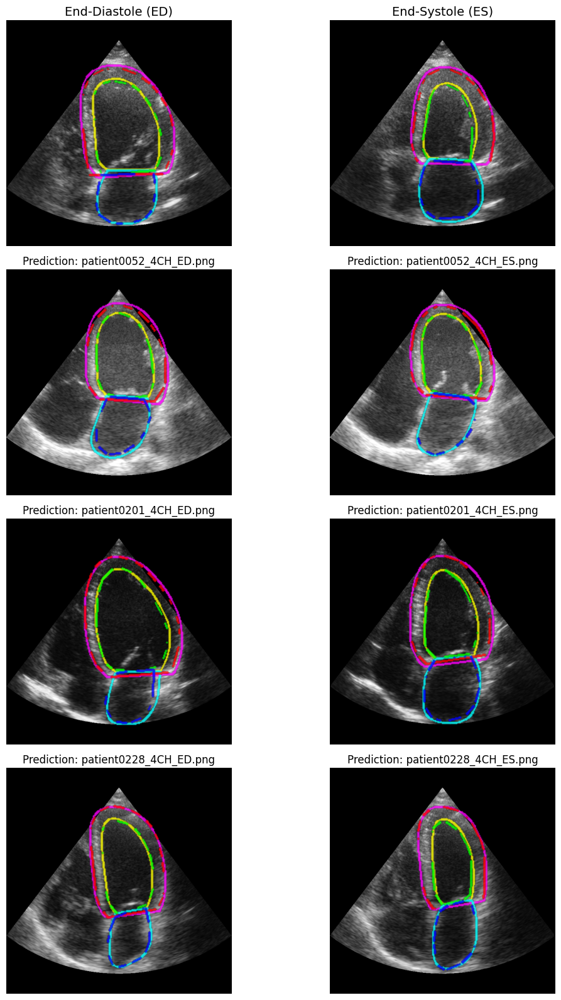

In [22]:
########################################
# Visualization of Predictions         #
########################################
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch
import os

# Updated colormap for predictions
pred_colors = {
    1: (255, 255, 0),  # Class 1 (yellow)
    2: (255, 0, 255),  # Class 2 (magenta)
    3: (0, 255, 255)   # Class 3 (cyan)
}

# Original colormap for ground truth
gt_colors = {
    1: (0, 255, 0),    # Class 1 (green)
    2: (255, 0, 0),    # Class 2 (red)
    3: (0, 0, 255)     # Class 3 (blue)
}

def create_solid_contours(mask, class_colors, thickness=2, alpha=0.8):
    """Create solid contours for predictions."""
    mask_solid = np.zeros((*mask.shape, 4), dtype=np.uint8)

    for c, color in class_colors.items():
        binary_mask = (mask == c).astype(np.uint8)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        convex_contours = [cv2.convexHull(cnt) for cnt in contours]
        cv2.drawContours(mask_solid, convex_contours, -1, (*color, int(255 * alpha)), thickness=thickness)

    return mask_solid

def create_hashed_overlay(mask, class_colors, thickness=2, dash_length=2, gap_length=7, alpha=0.8):
    """Creates a uniform hashed pattern overlay with consistent spacing."""
    mask_hashed = np.zeros((*mask.shape, 4), dtype=np.uint8)

    for c, color in class_colors.items():
        binary_mask = (mask == c).astype(np.uint8)
        # Create a slightly smaller mask to prevent overlap with solid lines
        kernel = np.ones((3,3), np.uint8)
        eroded_mask = cv2.erode(binary_mask, kernel, iterations=1)
        contours, _ = cv2.findContours(eroded_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        convex_contours = [cv2.convexHull(cnt) for cnt in contours]

        for cnt in convex_contours:
            perimeter = cv2.arcLength(cnt, True)
            num_points = int(perimeter / (dash_length + gap_length))
            if num_points < 2:
                continue

            resampled_points = []
            for i in range(num_points):
                dist = (i * perimeter) / num_points
                point = cv2.arcLength(cnt[:int((i/num_points)*len(cnt))], False)
                idx = 0
                curr_dist = 0
                while curr_dist < dist and idx < len(cnt)-1:
                    curr_dist += np.linalg.norm(cnt[idx+1][0] - cnt[idx][0])
                    idx += 1
                resampled_points.append(cnt[idx][0])

            for i in range(0, len(resampled_points)-1, 2):
                pt1 = tuple(resampled_points[i])
                pt2 = tuple(resampled_points[i+1])
                cv2.line(mask_hashed, pt1, pt2, (*color, int(255 * alpha)), thickness)

    return mask_hashed

# Manually specify test images
test_images = [
    "patient0027_4CH_ED.png", "patient0027_4CH_ES.png",
    "patient0052_4CH_ED.png", "patient0052_4CH_ES.png",
    "patient0201_4CH_ED.png", "patient0201_4CH_ES.png",
    "patient0228_4CH_ED.png", "patient0228_4CH_ES.png"
]

# Separate ED and ES images
ed_images = [img for img in test_images if "_ED" in img]
es_images = [img for img in test_images if "_ES" in img]

# Set up subplots: One column for ED and another for ES
num_rows = max(len(ed_images), len(es_images))
fig, axs = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, num_rows * 4))

model.eval()  # Ensure model is in evaluation mode

for row in range(num_rows):
    for col, image_list in enumerate([ed_images, es_images]):
        if row >= len(image_list):
            axs[row, col].axis("off")
            continue

        img_filename = image_list[row]
        img_path = os.path.join(test_images_path, img_filename)

        # Load and process image
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Get model prediction
        idx = test_dataset.images.index(img_filename)
        image, mask, _ = test_dataset[idx]
        image_batch = image.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(image_batch)
            pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

        # Create edge overlays
        pred_solid = create_solid_contours(pred, pred_colors)
        gt_hashed = create_hashed_overlay(mask.cpu().numpy(), gt_colors)

        # Resize masks to match original image
        pred_solid = cv2.resize(pred_solid, (original_image.shape[1], original_image.shape[0]))
        gt_hashed = cv2.resize(gt_hashed, (original_image.shape[1], original_image.shape[0]))

        # Convert original image to RGBA
        result = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGRA)

        # Layer the edges: first predictions (solid), then ground truth (dashed)
        for overlay in [pred_solid, gt_hashed]:
            alpha = overlay[:, :, 3:4].astype(float) / 255
            result = (overlay[:, :, :3] * alpha + result[:, :, :3] * (1 - alpha)).astype(np.uint8)

        # Display result
        axs[row, col].imshow(result)
        axs[row, col].set_title(f"Prediction: {img_filename}")
        axs[row, col].axis("off")

# Add column titles
axs[0, 0].set_title("End-Diastole (ED)", fontsize=14)
axs[0, 1].set_title("End-Systole (ES)", fontsize=14)

plt.tight_layout()
plt.show()

# Draft

## General functions


In [ ]:
# Function to compute ASSD for a single class
def compute_assd(pred, target):
    pred_boundary = pred - binary_erosion(pred).astype(float)
    target_boundary = target - binary_erosion(target).astype(float)

    pred_points = np.argwhere(pred_boundary > 0)
    target_points = np.argwhere(target_boundary > 0)

    if len(pred_points) == 0 or len(target_points) == 0:
        return 0  # ASSD is undefined if one of the masks is empty

    distances_pred_to_target = cdist(pred_points, target_points)
    distances_target_to_pred = cdist(target_points, pred_points)

    assd = (np.mean(np.min(distances_pred_to_target, axis=1)) +
            np.mean(np.min(distances_target_to_pred, axis=1))) / 2.0
    return assd

# Function to compute Dice coefficient
def compute_dice(pred, target):
    intersection = (pred * target).sum()
    dice = (2.0 * intersection) / (pred.sum() + target.sum() + 1e-6)
    return dice

# Function to compute IoU (Intersection over Union)
def compute_iou(pred, target):
    intersection = (pred * target).sum()
    union = (pred + target).clip(0, 1).sum()
    iou = intersection / (union + 1e-6)
    return iou

# Function to compute Hausdorff Distance (HD)
def compute_hd(pred, target):
    pred_boundary = pred - binary_erosion(pred).astype(float)
    target_boundary = target - binary_erosion(target).astype(float)

    pred_points = np.argwhere(pred_boundary > 0)
    target_points = np.argwhere(target_boundary > 0)

    if len(pred_points) == 0 or len(target_points) == 0:
        return 0  # HD is undefined if one of the masks is empty

    distances_pred_to_target = cdist(pred_points, target_points)
    distances_target_to_pred = cdist(target_points, pred_points)

    hd_pred_to_target = np.max(np.min(distances_pred_to_target, axis=1))  # max of min distances
    hd_target_to_pred = np.max(np.min(distances_target_to_pred, axis=1))  # max of min distances

    hd = max(hd_pred_to_target, hd_target_to_pred)
    return hd

# Function to compute F1 score
def compute_f1(pred, target):
    tp = (pred * target).sum()  # True positives
    fp = ((pred == 1) & (target == 0)).sum()  # False positives
    fn = ((pred == 0) & (target == 1)).sum()  # False negatives

    if tp + fp + fn == 0:  # Avoid division by zero
        return 0.0

    precision = tp / (tp + fp + 1e-6)
    recall = tp / (tp + fn + 1e-6)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)
    return f1

## Simple Average Approach


### Test on the whole images


In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
from scipy.spatial.distance import cdist
from tabulate import tabulate

NUM_CLASSES = 4

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

###################################################################
# Overall & Per Class Evaluation with dice, IOU, ASSD, HD, and F1 #
###################################################################
iou_per_class = [0.0] * (NUM_CLASSES)
dice_per_class = [0.0] * (NUM_CLASSES)
assd_per_class = [0.0] * (NUM_CLASSES)
hd_per_class = [0.0] * (NUM_CLASSES)
f1_per_class = [0.0] * (NUM_CLASSES)
num_samples = 0

# Initialize accumulators for overall metrics
overall_iou = 0.0
overall_dice = 0.0
overall_assd = 0.0
overall_hd = 0.0
overall_f1 = 0.0

# For loss
num_batches = 0
test_loss = 0.0

with torch.no_grad():
    for images, masks,_ in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)

        loss = criterion(outputs, masks)
        test_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        batch_iou = 0.0
        batch_dice = 0.0
        batch_assd = 0.0
        batch_hd = 0.0
        batch_f1 = 0.0

        for i in range(images.size(0)):
            iou_scores = []
            dice_scores = []
            assd_scores = []
            hd_scores = []
            f1_scores = []
            for c in range(1, NUM_CLASSES):  # Exclude background class
                pred_c = (preds[i] == c).float().cpu().numpy()
                target_c = (masks[i] == c).float().cpu().numpy()

                # IoU and Dice
                iou_value = compute_iou(pred_c, target_c)
                iou_scores.append(iou_value)
                iou_per_class[c] += iou_value

                dice_value = compute_dice(pred_c, target_c)
                dice_scores.append(dice_value)
                dice_per_class[c] += dice_value

                # ASSD
                assd_value = compute_assd(pred_c, target_c)
                assd_scores.append(assd_value)
                if assd_value is not None:
                    assd_per_class[c] += assd_value

                # Hausdorff Distance (HD)
                hd_value = compute_hd(pred_c, target_c)
                hd_scores.append(hd_value)
                if hd_value is not None:
                    hd_per_class[c] += hd_value

                # F1 Score
                f1_value = compute_f1(pred_c, target_c)
                f1_scores.append(f1_value)
                f1_per_class[c] += f1_value


            # Compute overall IoU and Dice for this image (excluding background)
            batch_iou += sum(iou_scores) / (NUM_CLASSES - 1)  # Exclude background class
            batch_dice += sum(dice_scores) / (NUM_CLASSES - 1)  # Exclude background class
            batch_assd += sum(assd_scores) / (NUM_CLASSES - 1)  # Exclude background class
            batch_hd += sum(hd_scores) / (NUM_CLASSES - 1)  # Exclude background class
            batch_f1 += sum(f1_scores) / (NUM_CLASSES - 1)  # Exclude background class

            num_samples += 1

        batch_iou /= images.size(0)
        batch_dice /= images.size(0)
        batch_assd /= images.size(0)
        batch_hd /= images.size(0)
        batch_f1 /= images.size(0)

        overall_iou += batch_iou
        overall_dice += batch_dice
        overall_assd += batch_assd
        overall_hd += batch_hd
        overall_f1 += batch_f1
        num_batches += 1

# Compute loss
test_loss /= num_batches

# Compute Overall
overall_iou /= num_batches
overall_dice /= num_batches
overall_assd /= num_batches
overall_hd /= num_batches
overall_f1 /= num_batches

# Normalize metrics per class
iou_per_class = [iou / num_samples for iou in iou_per_class]
dice_per_class = [dice / num_samples for dice in dice_per_class]
assd_per_class = [assd / num_samples for assd in assd_per_class]
hd_per_class = [hd / num_samples for hd in hd_per_class]
f1_per_class = [f1 / num_samples for f1 in f1_per_class]


print("\nTest Results:")
print(f"Test Loss: {test_loss:.4f}\n")

# Define class names
class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

# Prepare results for overall evaluation and per-class evaluation
overall_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
]

per_class_results = []
for c in range(1, NUM_CLASSES):  # Exclude background class
    per_class_results.append([class_names[c-1],  # Use class names instead of "Class 1", "Class 2", etc.
                              f"{dice_per_class[c]:.3f}",
                              f"{iou_per_class[c]:.3f}",
                              f"{assd_per_class[c]:.2f}",
                              f"{hd_per_class[c]:.1f}",
                              f"{f1_per_class[c]:.3f}"])

# Combine overall and per-class results into one table
combined_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
] + per_class_results

# Table headers
headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

# Print the combined table with specific formats for each column
print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

<ipython-input-25-93f3761cce8d>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=de


Test Results:
Test Loss: 0.0854

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.919 | 0.853 |   0.93 |         3.2 |      0.919 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.947 | 0.900 |   0.86 |         2.9 |      0.947 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.884 | 0.795 |   0.97 |         3.4 |      0.884 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.928 | 0.868 |   0.95 |         3.1 |      0.928 |
+----------------+--------+-------+--------+-------------+------------+


### Test on ED & ES images separatly


In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
from scipy.spatial.distance import cdist
from tabulate import tabulate

NUM_CLASSES = 4

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

###################################################################
# Overall & Per Class Evaluation with dice, IOU, ASSD, HD, and F1 #
###################################################################
# Function to evaluate a specific DataLoader
def evaluate(loader, loader_name):
    print(f"Evaluating {loader_name} frames...\n")

    iou_per_class = [0.0] * (NUM_CLASSES)
    dice_per_class = [0.0] * (NUM_CLASSES)
    assd_per_class = [0.0] * (NUM_CLASSES)
    hd_per_class = [0.0] * (NUM_CLASSES)
    f1_per_class = [0.0] * (NUM_CLASSES)
    num_samples = 0

    # Initialize accumulators for overall metrics
    overall_iou = 0.0
    overall_dice = 0.0
    overall_assd = 0.0
    overall_hd = 0.0
    overall_f1 = 0.0

    # For loss
    num_batches = 0
    test_loss = 0.0

    with torch.no_grad():
        for images, masks  in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)

            loss = criterion(outputs, masks)
            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            batch_iou = 0.0
            batch_dice = 0.0
            batch_assd = 0.0
            batch_hd = 0.0
            batch_f1 = 0.0

            for i in range(images.size(0)):
                iou_scores = []
                dice_scores = []
                assd_scores = []
                hd_scores = []
                f1_scores = []
                for c in range(1, NUM_CLASSES):  # Exclude background class
                    pred_c = (preds[i] == c).float().cpu().numpy()
                    target_c = (masks[i] == c).float().cpu().numpy()

                    # IoU and Dice
                    iou_value = compute_iou(pred_c, target_c)
                    iou_scores.append(iou_value)
                    iou_per_class[c] += iou_value

                    dice_value = compute_dice(pred_c, target_c)
                    dice_scores.append(dice_value)
                    dice_per_class[c] += dice_value

                    # ASSD
                    assd_value = compute_assd(pred_c, target_c)
                    assd_scores.append(assd_value)
                    if assd_value is not None:
                        assd_per_class[c] += assd_value

                    # Hausdorff Distance (HD)
                    hd_value = compute_hd(pred_c, target_c)
                    hd_scores.append(hd_value)
                    if hd_value is not None:
                        hd_per_class[c] += hd_value

                    # F1 Score
                    f1_value = compute_f1(pred_c, target_c)
                    f1_scores.append(f1_value)
                    f1_per_class[c] += f1_value


                # Compute overall IoU and Dice for this image (excluding background)
                batch_iou += sum(iou_scores) / (NUM_CLASSES - 1)  # Exclude background class
                batch_dice += sum(dice_scores) / (NUM_CLASSES - 1)  # Exclude background class
                batch_assd += sum(assd_scores) / (NUM_CLASSES - 1)  # Exclude background class
                batch_hd += sum(hd_scores) / (NUM_CLASSES - 1)  # Exclude background class
                batch_f1 += sum(f1_scores) / (NUM_CLASSES - 1)  # Exclude background class

                num_samples += 1

            batch_iou /= images.size(0)
            batch_dice /= images.size(0)
            batch_assd /= images.size(0)
            batch_hd /= images.size(0)
            batch_f1 /= images.size(0)

            overall_iou += batch_iou
            overall_dice += batch_dice
            overall_assd += batch_assd
            overall_hd += batch_hd
            overall_f1 += batch_f1
            num_batches += 1

    # Compute loss
    test_loss /= num_batches

    # Compute Overall
    overall_iou /= num_batches
    overall_dice /= num_batches
    overall_assd /= num_batches
    overall_hd /= num_batches
    overall_f1 /= num_batches

    # Normalize metrics per class
    iou_per_class = [iou / num_samples for iou in iou_per_class]
    dice_per_class = [dice / num_samples for dice in dice_per_class]
    assd_per_class = [assd / num_samples for assd in assd_per_class]
    hd_per_class = [hd / num_samples for hd in hd_per_class]
    f1_per_class = [f1 / num_samples for f1 in f1_per_class]


    print("\nTest Results:")
    print(f"Test Loss: {test_loss:.4f}\n")

    # Define class names
    class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

    # Prepare results for overall evaluation and per-class evaluation
    overall_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ]

    per_class_results = []
    for c in range(1, NUM_CLASSES):  # Exclude background class
        per_class_results.append([class_names[c-1],  # Use class names instead of "Class 1", "Class 2", etc.
                                f"{dice_per_class[c]:.3f}",
                                f"{iou_per_class[c]:.3f}",
                                f"{assd_per_class[c]:.2f}",
                                f"{hd_per_class[c]:.1f}",
                                f"{f1_per_class[c]:.3f}"])

    # Combine overall and per-class results into one table
    combined_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ] + per_class_results

    # Table headers
    headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

    # Print the combined table with specific formats for each column
    print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

# Evaluate ED and ES frames separately
evaluate(ed_loader, "ED")
evaluate(es_loader, "ES")

Evaluating ED frames...



<ipython-input-26-8b13540edad7>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=de


Test Results:
Test Loss: 0.0887

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.915 | 0.846 |   0.95 |         3.3 |      0.915 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.954 | 0.913 |   0.86 |         3.0 |      0.954 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.882 | 0.791 |   0.94 |         3.4 |      0.882 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.916 | 0.850 |   1.00 |         3.2 |      0.916 |
+----------------+--------+-------+--------+-------------+------------+
Evaluating ES frames...


Test Results:
Test Loss: 0.0829

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD 

## Weighted Average Approach

### Test on the whole images


In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
from scipy.spatial.distance import cdist
from tabulate import tabulate

NUM_CLASSES = 4

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

###################################################################
# Overall & Per Class Evaluation with dice, IOU, ASSD, HD, and F1 #
###################################################################
iou_per_class = [0.0] * (NUM_CLASSES)
dice_per_class = [0.0] * (NUM_CLASSES)
assd_per_class = [0.0] * (NUM_CLASSES)
hd_per_class = [0.0] * (NUM_CLASSES)
f1_per_class = [0.0] * (NUM_CLASSES)
num_samples = 0

# Initialize accumulators for overall metrics
overall_iou = 0.0
overall_dice = 0.0
overall_assd = 0.0
overall_hd = 0.0
overall_f1 = 0.0
class_weights = [0.0] * (NUM_CLASSES)  # To calculate class-specific weights

# For Test loss
num_batches = 0
test_loss = 0.0

with torch.no_grad():
    for images, masks,_ in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)

        loss = criterion(outputs, masks)
        test_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        for i in range(images.size(0)):
            for c in range(1, NUM_CLASSES):  # Exclude background class
                pred_c = (preds[i] == c).float().cpu().numpy()
                target_c = (masks[i] == c).float().cpu().numpy()

                # IoU and Dice
                iou_value = compute_iou(pred_c, target_c)
                iou_per_class[c] += iou_value

                dice_value = compute_dice(pred_c, target_c)
                dice_per_class[c] += dice_value

                # ASSD
                assd_value = compute_assd(pred_c, target_c)
                if assd_value is not None:
                    assd_per_class[c] += assd_value

                # Hausdorff Distance (HD)
                hd_value = compute_hd(pred_c, target_c)
                if hd_value is not None:
                    hd_per_class[c] += hd_value

                # F1 Score
                f1_value = compute_f1(pred_c, target_c)
                f1_per_class[c] += f1_value

                # Update weights for overall metrics
                class_weight = target_c.sum()  # Total pixels in the ground truth for class c
                class_weights[c] += class_weight
                overall_iou += (iou_value) * class_weight
                overall_dice += (dice_value) * class_weight
                if assd_value is not None:
                    overall_assd += assd_value * class_weight
                if hd_value is not None:
                    overall_hd += hd_value * class_weight
                overall_f1 += f1_value * class_weight

            num_samples += 1

        num_batches += 1

# Compute loss
test_loss /= num_batches

# Normalize metrics per class
iou_per_class = [iou / num_samples for iou in iou_per_class]
dice_per_class = [dice / num_samples for dice in dice_per_class]
assd_per_class = [assd / num_samples for assd in assd_per_class]
hd_per_class = [hd / num_samples for hd in hd_per_class]
f1_per_class = [f1 / num_samples for f1 in f1_per_class]

# Compute overall metrics by weighted average
total_weight = sum(class_weights[1:])  # Exclude background class weight
overall_iou /= total_weight
overall_dice /= total_weight
overall_assd /= total_weight
overall_hd /= total_weight
overall_f1 /= total_weight


print("\nTest Results:")
print(f"Test Loss: {test_loss:.4f}\n")

# Define class names
class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

# Prepare results for overall evaluation and per-class evaluation
overall_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
]

per_class_results = []
for c in range(1, NUM_CLASSES):  # Exclude background class
    per_class_results.append([class_names[c-1],  # Use class names instead of "Class 1", "Class 2", etc.
                              f"{dice_per_class[c]:.3f}",
                              f"{iou_per_class[c]:.3f}",
                              f"{assd_per_class[c]:.2f}",
                              f"{hd_per_class[c]:.1f}",
                              f"{f1_per_class[c]:.3f}"])

# Combine overall and per-class results into one table
combined_results = [
    ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
] + per_class_results

# Table headers
headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

# Print the combined table with specific formats for each column
print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

<ipython-input-27-8062ce294e85>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=de


Test Results:
Test Loss: 0.0854

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.921 | 0.857 |   0.95 |         3.3 |      0.921 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.947 | 0.900 |   0.86 |         2.9 |      0.947 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.884 | 0.795 |   0.97 |         3.4 |      0.884 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.928 | 0.868 |   0.95 |         3.1 |      0.928 |
+----------------+--------+-------+--------+-------------+------------+


### Test on ED & ES images separatly


In [ ]:
import numpy as np
from scipy.ndimage import binary_erosion
from scipy.spatial.distance import cdist
from tabulate import tabulate

NUM_CLASSES = 4

# Load the best model weights
model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=device))
model.eval()

###################################################################
# Overall & Per Class Evaluation with dice, IOU, ASSD, HD, and F1 #
###################################################################

# Function to evaluate a specific DataLoader
def evaluate(loader, loader_name):
    print(f"Evaluating {loader_name} frames...\n")
    iou_per_class = [0.0] * (NUM_CLASSES)
    dice_per_class = [0.0] * (NUM_CLASSES)
    assd_per_class = [0.0] * (NUM_CLASSES)
    hd_per_class = [0.0] * (NUM_CLASSES)
    f1_per_class = [0.0] * (NUM_CLASSES)
    num_samples = 0

    # Initialize accumulators for overall metrics
    overall_iou = 0.0
    overall_dice = 0.0
    overall_assd = 0.0
    overall_hd = 0.0
    overall_f1 = 0.0
    class_weights = [0.0] * (NUM_CLASSES)  # To calculate class-specific weights

    # For Test loss
    num_batches = 0
    test_loss = 0.0

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)

            loss = criterion(outputs, masks)
            test_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            for i in range(images.size(0)):
                for c in range(1, NUM_CLASSES):  # Exclude background class
                    pred_c = (preds[i] == c).float().cpu().numpy()
                    target_c = (masks[i] == c).float().cpu().numpy()

                    # IoU and Dice
                    iou_value = compute_iou(pred_c, target_c)
                    iou_per_class[c] += iou_value

                    dice_value = compute_dice(pred_c, target_c)
                    dice_per_class[c] += dice_value

                    # ASSD
                    assd_value = compute_assd(pred_c, target_c)
                    if assd_value is not None:
                        assd_per_class[c] += assd_value

                    # Hausdorff Distance (HD)
                    hd_value = compute_hd(pred_c, target_c)
                    if hd_value is not None:
                        hd_per_class[c] += hd_value

                    # F1 Score
                    f1_value = compute_f1(pred_c, target_c)
                    f1_per_class[c] += f1_value

                    # Update weights for overall metrics
                    class_weight = target_c.sum()  # Total pixels in the ground truth for class c
                    class_weights[c] += class_weight
                    overall_iou += (iou_value) * class_weight
                    overall_dice += (dice_value) * class_weight
                    if assd_value is not None:
                        overall_assd += assd_value * class_weight
                    if hd_value is not None:
                        overall_hd += hd_value * class_weight
                    overall_f1 += f1_value * class_weight

                num_samples += 1

            num_batches += 1

    # Compute loss
    test_loss /= num_batches

    # Normalize metrics per class
    iou_per_class = [iou / num_samples for iou in iou_per_class]
    dice_per_class = [dice / num_samples for dice in dice_per_class]
    assd_per_class = [assd / num_samples for assd in assd_per_class]
    hd_per_class = [hd / num_samples for hd in hd_per_class]
    f1_per_class = [f1 / num_samples for f1 in f1_per_class]

    # Compute overall metrics by weighted average
    total_weight = sum(class_weights[1:])  # Exclude background class weight
    overall_iou /= total_weight
    overall_dice /= total_weight
    overall_assd /= total_weight
    overall_hd /= total_weight
    overall_f1 /= total_weight


    print("\nTest Results:")
    print(f"Test Loss: {test_loss:.4f}\n")

    # Define class names
    class_names = ["Left Ventricle", "Myocardium", "Left Atrium"]

    # Prepare results for overall evaluation and per-class evaluation
    overall_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ]

    per_class_results = []
    for c in range(1, NUM_CLASSES):  # Exclude background class
        per_class_results.append([class_names[c-1],  # Use class names instead of "Class 1", "Class 2", etc.
                                f"{dice_per_class[c]:.3f}",
                                f"{iou_per_class[c]:.3f}",
                                f"{assd_per_class[c]:.2f}",
                                f"{hd_per_class[c]:.1f}",
                                f"{f1_per_class[c]:.3f}"])

    # Combine overall and per-class results into one table
    combined_results = [
        ["Overall", f"{overall_dice:.3f}", f"{overall_iou:.3f}", f"{overall_assd:.2f}", f"{overall_hd:.1f}", f"{overall_f1:.3f}"]
    ] + per_class_results

    # Table headers
    headers = ["Class", "Dice", "IoU", "ASSD", "Hausdorff", "F1 Score"]

    # Print the combined table with specific formats for each column
    print(tabulate(combined_results, headers=headers, tablefmt="grid", floatfmt=(".3f", ".3f", ".3f", ".2f", ".1f", ".3f")))

# Evaluate ED and ES frames separately
evaluate(ed_loader, "ED")
evaluate(es_loader, "ES")

Evaluating ED frames...



<ipython-input-28-abcc296ae0f5>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(model_path, "best_model.pth"), map_location=de


Test Results:
Test Loss: 0.0887

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD |   Hausdorff |   F1 Score |
+================+========+=======+========+=============+============+
| Overall        |  0.921 | 0.858 |   0.96 |         3.3 |      0.921 |
+----------------+--------+-------+--------+-------------+------------+
| Left Ventricle |  0.954 | 0.913 |   0.86 |         3.0 |      0.954 |
+----------------+--------+-------+--------+-------------+------------+
| Myocardium     |  0.882 | 0.791 |   0.94 |         3.4 |      0.882 |
+----------------+--------+-------+--------+-------------+------------+
| Left Atrium    |  0.916 | 0.850 |   1.00 |         3.2 |      0.916 |
+----------------+--------+-------+--------+-------------+------------+
Evaluating ES frames...


Test Results:
Test Loss: 0.0829

+----------------+--------+-------+--------+-------------+------------+
| Class          |   Dice |   IoU |   ASSD 